# Employee Segmentation Clustering

### Unsupervised Learning

1. In Machine Learning, clustering is the unsupervised technique of grouping similar instances together. The idea of similarity depends on the task, for example, in some cases two nearby instances can be considered similar (euclidean distance).

## Modelling objectives

1. Identify the groups of target employees, as well as suggest relevant **employee retention** strategies/recommendations to be taken so as to reduce **attrition rates** in the company, thereby improving workforce productivity.
2. Tap on unsupervised clustering machine learning algorithms to achieve `employee segmentation` such that we have clear understanding of the employee segments

#### Problem Statement and background research

> As a HR manager, you want to understand your employees so that appropriate
direction can be given to the management to satisfy and retain the employees

![alt text](https://www.personneltoday.com/wp-content/uploads/sites/8/2017/04/employee-segmentation.jpg "Expanding Window")
!["test"](https://antonsruberts.github.io/assets/images/kproto_audience/header.jpg)

### Problem understanding

1. To begin, we need to understand why employees *leave?*
2. According to the Manpower research and statistics department (Singapore), given the impact Covid-19 has on the labour market, there was an observed increase of annual average resignation rates of 1.8% in 2021, from a previous 1.5%, which is almost as high as the recruitment rate. [4] This shows that given the impact covid-19 has on the economy, employees are leaving due to the economic downturn. This is certainly worrying and we will explore the negative consequences of such a phenomenom.

3. There are many reasons for employee turnover, this includes: economic downturn, bad company management, unhealthy working environment, better prospects in another organization in terms of career growth, etc. Employees also may feel that their work is not what they imagined, or perhaps may feel devalued, and unrecognized. [2]


### **Background : Understanding the bane of employee turnover:**
1. Employee turnover is a huge problem for companies. The true cost of replacing an employee can often be quite large. This cost can be also known as turnover costs
1. Cost of turnover refers to expenses both tangible or intangible associated with replacing an employee. Turnover costs include expenses like: unemployment compensation, time and materials for new hire. [7]
3. A report produced by Center for American Progress discovered that for all positions, except for executives and physicians jobs that require very specific skills, the typical median cost of turnover was 21% of an employee’s annual salary. Furthermore, for workers earning less than 50,000 dollars annually which consists of 75% of the workers in the US, case studies show a typical cost of turnover of 20 percent of salary, the same as across positions earning $75,000 a year or less, which includes 9 in 10 U.S. workers. [1]
4. Similarly, according to Organization Science, the estimated cost of turning over one employee earning $8 per hour at a retail chain store is up to $25,000. [5]

4. A survey (allied workforce) conducted also discovered that about 30% of companies felt that it takes a year or longer for a new employee to reach the level of productivity of a previously departing employee. [3]
4. To summarise, the cost of replacing employees (which is especially higher for experienced ones due to level of seniority) remains largely significant. This can be due to the fact of the amount of time spent to interview and find new replacements, providing sign-on bonuses, and the severe loss of productivity while the new employee gets accustomed to a new job. All these problems can be a hindrance that prevents the company from flourishing in terms of productivity and revenue
5. Therefore, we need to recognize the **importance** of developing a profound understanding towards employees, understanding what motivates, engage and satisfy employees is crucial to accommodate their needs. Hence, brainstorming and implementing relevant retention strategies will ultimately lead to higher employee contentment thereby, more employees staying behind, this will benefit the employee yet simultaneously contributing to a very successful company. 

6. All in all, employees are the 'backbone' of any organization, and employee retention strategies are integral to the success and interests of a company and to avoid the negative impacts of attrition and turnover costs. 

> ##### More specifically, as a HR manager, the aim is to devise employee retention (make employees stay) ideas through analysis, we want to ask ourselves a few questions throughout the process:
1. What could be indicators/reasons of an employee leaving the organisation? We need to explore more on this
2. From an employee's perspective, how can we appear more attractive/appealing towards an employee such as they remain loyal to the organization
3. What can we say about the each employee cluster

##### General imports

In [1]:
# !pip install phik tqdm 

In [2]:
from typing import Sequence, Tuple
from itertools import chain,combinations
from tqdm import tqdm
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd
import matplotlib.cm as cm
import seaborn as sns;sns.set()
from scipy.spatial import Voronoi, voronoi_plot_2d
from scipy.spatial.qhull import QhullError
import plotly.express as px
import plotly.graph_objects as go
from plotly.subplots import make_subplots
from IPython.display import display, Markdown
from scipy import stats
from scipy.stats import kurtosis,f_oneway,levene
from collections import defaultdict
%matplotlib inline
import warnings
warnings.filterwarnings("ignore")

In [3]:
# Please install for EDA purposes
import phik
from phik import resources, report
from phik.report import plot_correlation_matrix

SKlearn imports

In [4]:
import sklearn
# Data preprocessing
from sklearn.preprocessing import StandardScaler, MinMaxScaler,LabelEncoder,OneHotEncoder
from sklearn.compose import ColumnTransformer
# Pipeline
from sklearn.pipeline import Pipeline,make_pipeline
# Clustering models
from sklearn.cluster import KMeans, AgglomerativeClustering ,DBSCAN, OPTICS,SpectralClustering,estimate_bandwidth,OPTICS,Birch, MeanShift, MiniBatchKMeans, AffinityPropagation
from sklearn.mixture import GaussianMixture
# Metrics/evaluation
from sklearn.metrics import calinski_harabasz_score,davies_bouldin_score, silhouette_score, silhouette_samples
from sklearn.neighbors import DistanceMetric
from sklearn.metrics.pairwise import PAIRWISE_DISTANCE_FUNCTIONS 

# Viz (EDA,etc )
from sklearn.manifold import TSNE,SpectralEmbedding
from sklearn.decomposition import TruncatedSVD,PCA
from scipy.cluster.hierarchy import dendrogram
from sklearn.tree import DecisionTreeClassifier,plot_tree,export_graphviz

rstate = 38
# Setting random state

For visualization, and dimensionality reduction/ and gower (distance) for handling mixed data types of categorical and numerical

In [5]:
from prince import FAMD,MFA,MCA
from gower import gower_matrix
import gower

KPrototypes
> [Source](https://github.com/nicodv/kmodes)

In [6]:
# !pip install kmodes
# Kprototypes under asset folder

In [7]:
try:
    from assets.kmodes.kprototypes import KPrototypes
    from assets.kmodes.kmodes import KModes
except:
    from kmodes.kprototypes import KPrototypes
    from kmodes.kprototypes import KPrototypes
finally:
    from assets.kmodes.kprototypes import KPrototypes
    from assets.kmodes.kmodes import KModes
# Import from folder

<h1> Reading of dataset </h1>

1. This is a dataset collected from HR department in a company, it contains general data of 1470 employees such as gender, work department, etc.
1. Dataset has several categorical variables (in numerical format as well).
2. High number of attributes. (high dimension)
3. To facilitate visualisations and cluster analysis/interpretation, _may_ need to perform dimensionality reduction
4. Attribute names are very long, we will change it later
6. Immediate task: To perform employee segmentation and brainstorm effective yet feasible strategies to retain employees.

In [8]:
comp_df = pd.read_csv('dataset/Company_Employee.csv')
display(comp_df.head(), comp_df.shape)

,Age,Gender,BusinessTravel,Job Function,Distance Between Company and Home (KM),"Education (1 is lowest, 5 is highest)","Job Satisfaction (1 is lowest, 4 is highest)",MaritalStatus,Salary ($),"Performance Rating (1 is lowest, 4 is highest)","Work Life Balance (1 is worst, 4 is best)",Length of Service (Years),Resign Status
0,41,Female,Travel_Rarely,Sales,1,2,4,Single,5993,3,1,6,Yes
1,49,Male,Travel_Frequently,Research & Development,8,1,2,Married,5130,4,3,10,No
2,37,Male,Travel_Rarely,Research & Development,2,2,3,Single,2090,3,3,0,Yes
3,33,Female,Travel_Frequently,Research & Development,3,4,3,Married,2909,3,3,8,No
4,27,Male,Travel_Rarely,Research & Development,2,1,2,Married,3468,3,3,2,No


(1470, 13)

## Exploratory Data Analysis
We will be carrying out data exploration to further understand the characteristics of our employee data before modelling

### General dataset info:
1. Dataset has 1470 rows and 13 columns
2. Very long attribute names, we will make a data dictionary, and rename them to a shorter and convenient form.

In [9]:
display('Shape of dataset',comp_df.shape)
# Show shape

'Shape of dataset'

(1470, 13)

### Data dictionary *
| Attribute | Information | Data type|
| :--- | :--- | :--- |
|`Age`| Age of employee | Numerical-Integer |
| `Gender`| Gender of employee | String (`Male` or `Female`)  |
| `BusinessTravel` | Travel frequency of the employee for business | String (`3` unique values) |
| `Job Function` | Department of the employee | String (`3` unique values) |
| `Distance Between Company and Home (KM)` | Distance Between Company and Home| Numerical-Integer |
| `Education (1 is lowest, 5 is highest)` | Level of education qualification of employee  | Integer- Categorical  |
| `Job Satisfaction (1 is lowest, 4 is highest)	` | Job satisfaction | Integer- Categorical  |
|`MaritalStatus`| Marital Status | String (`3` unique values)  |
|`Salary ($)`| Employee's salary| Numerical|
|`Performance Rating (1 is lowest, 4 is highest)`| Employee's performance rating in the company| Integer- Categorical  |
|`Work Life Balance (1 is worst, 4 is best)`| Work life balance rating| Integer- Categorical  |
|`Length of Service (Years)`| No. of years employee works for the company | Numerical-Integer|
|`Resign Status`| Whether employee is still with the company| String (`Yes` or `No`) |

Rename some columns as they are extremely long

In [10]:
comp_df.rename({'Distance Between Company and Home (KM)': 'Distance (KM)', 'Education (1 is lowest, 5 is highest)': 'Education', 'Job Satisfaction (1 is lowest, 4 is highest)': 'Job_satis', 'Performance Rating (1 is lowest, 4 is highest)': 'Perf_rating', 'Work Life Balance (1 is worst, 4 is best)': 'WorkLifeBalance'},inplace=True,axis=1)

> ### **Descriptive statistics**
1. Dataset shape is (1470,13)
3. Standard deviation for salary is very high, suggesting a large spread where salary vary quite significantly. (drastic jump from 75th percentile to max can be observed as well), suggesting a right skewed distribution, with possible existance of outliers.
2. To cite specific values, the median salary is 4.9k while the max is 20k.

3. Two things to note is that an average employee earns around 6.5k, and median may be a better central tendancy to measure salary in this case
4. Similar mean and median for age may suggest a symmetrical distribution. Pretty high standard deviation observed from age (9), suggests employees of the organization have somewhat differing ages. One thing to note that the youngest employee is only 18 years old, similar to a student. Moreover, the typical employee is of middle age group, given that 50% of the employees are between 30 and 43 years old.
5. More males than females in the organization.
6. Distance between home and company seems to follow a slight right skewed distribution given the sharp jump from 75th percentile to max.
7. Longest serving employee at the company has been serving for around 40 years.
5. Some attributes have very consistent percentiles, this may suggest a categorical variable in numerical format.
5. Attributes are of widely differing magnitudes, we need to perform scaling, even more so since this is a clustering task.
6. Generally, we conclude that there are no erroneous or anomalous values.

In [11]:
display(comp_df.describe(include='all'))
display(comp_df.info())

,Age,Gender,BusinessTravel,Job Function,Distance (KM),Education,Job_satis,MaritalStatus,Salary ($),Perf_rating,WorkLifeBalance,Length of Service (Years),Resign Status
count,1470.000000,1470,1470,1470,1470.000000,1470.000000,1470.000000,1470,1470.000000,1470.000000,1470.000000,1470.000000,1470
unique,NaN,2,3,3,NaN,NaN,NaN,3,NaN,NaN,NaN,NaN,2
top,NaN,Male,Travel_Rarely,Research & Development,NaN,NaN,NaN,Married,NaN,NaN,NaN,NaN,No
freq,NaN,882,1043,961,NaN,NaN,NaN,673,NaN,NaN,NaN,NaN,1233
mean,36.923810,NaN,NaN,NaN,9.192517,2.912925,2.728571,NaN,6502.931293,3.153741,2.761224,7.008163,NaN
std,9.135373,NaN,NaN,NaN,8.106864,1.024165,1.102846,NaN,4707.956783,0.360824,0.706476,6.126525,NaN
min,18.000000,NaN,NaN,NaN,1.000000,1.000000,1.000000,NaN,1009.000000,3.000000,1.000000,0.000000,NaN
25%,30.000000,NaN,NaN,NaN,2.000000,2.000000,2.000000,NaN,2911.000000,3.000000,2.000000,3.000000,NaN
50%,36.000000,NaN,NaN,NaN,7.000000,3.000000,3.000000,NaN,4919.000000,3.000000,3.000000,5.000000,NaN
75%,43.000000,NaN,NaN,NaN,14.000000,4.000000,4.000000,NaN,8379.000000,3.000000,3.000000,9.000000,NaN


<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1470 entries, 0 to 1469
Data columns (total 13 columns):
 #   Column                     Non-Null Count  Dtype 
---  ------                     --------------  ----- 
 0   Age                        1470 non-null   int64 
 1   Gender                     1470 non-null   object
 2   BusinessTravel             1470 non-null   object
 3   Job Function               1470 non-null   object
 4   Distance (KM)              1470 non-null   int64 
 5   Education                  1470 non-null   int64 
 6   Job_satis                  1470 non-null   int64 
 7   MaritalStatus              1470 non-null   object
 8   Salary ($)                 1470 non-null   int64 
 9   Perf_rating                1470 non-null   int64 
 10  WorkLifeBalance            1470 non-null   int64 
 11  Length of Service (Years)  1470 non-null   int64 
 12  Resign Status              1470 non-null   object
dtypes: int64(8), object(5)
memory usage: 149.4+ KB


None

### Missing Values Analysis
1. This is a very clean dataset, with no missing data, which is a good thing.

Age                          0
Gender                       0
BusinessTravel               0
Job Function                 0
Distance (KM)                0
Education                    0
Job_satis                    0
MaritalStatus                0
Salary ($)                   0
Perf_rating                  0
WorkLifeBalance              0
Length of Service (Years)    0
Resign Status                0
dtype: int64

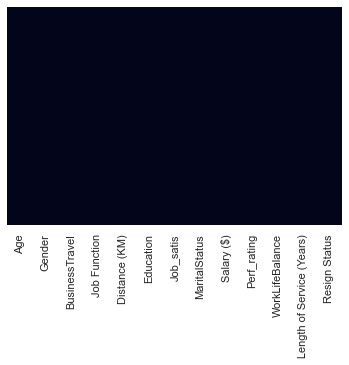

In [12]:
display(comp_df.isna().sum())
sns.heatmap(comp_df.isnull(),yticklabels=False,cbar=False)
plt.show()
# No missing values.

# Further Exploratory Data Analysis

In [13]:
compEDA = comp_df.copy()
# Prevent changes to original dataset

## Exploring data types and unqiue values for some attributes.
1. We are greeted with a plethora of different attributes. For example, we have education which is a categorical variable that is ordinal in nature, and salary which is numerical and continuous in nature.
1. We notice 9 categorical variables, that are both in numerical and string format, as well as 4 numerical-continuous/discrete variables.
1. Variables generally represented in correct data types. One thing to note is that there may be some categorical attributes that are in numerical format, for example attributes with ordinal data like `Education (1 is lowest, 5 is highest)` may be `categorical` type. I will go through in detail how we should handle these variables with differing data types later on.

3. However, one thing to note is that we may face a few problems given that we have many categorical attributes and fewer numerical-continuous/discrete attributes.
5. We can brainstorm a few methods to tackle this problem, one method is to use clustering techniques such as using K-Prototypes, or even perform _unsupervised feature selection and statistical tests to determine the relevance and significance of the categorical attribute_. This is also done to reduce the ambiguity of clustering.
6. Out of all the methods, I deemed most of it to be suitable, especially determining the significance of the attributes, where we also can try to reduce the feature space.
7. For this study I will use `Label Encoding` for the sole purpose of visualization and not for modelling.
8. Concretely, I will use Label encoding for EDA, so that we can discover distinct clusters, and also group variables with ease.

In [14]:
display(compEDA.dtypes)

Age                           int64
Gender                       object
BusinessTravel               object
Job Function                 object
Distance (KM)                 int64
Education                     int64
Job_satis                     int64
MaritalStatus                object
Salary ($)                    int64
Perf_rating                   int64
WorkLifeBalance               int64
Length of Service (Years)     int64
Resign Status                object
dtype: object

Change into category data type for some categorical attributes in numerical format

In [15]:
compEDA[['Education', 'Job_satis', 'Perf_rating', 'WorkLifeBalance', 'Gender']] = \
compEDA[['Education', 'Job_satis', 'Perf_rating', 'WorkLifeBalance', 'Gender']].astype('category')

In [16]:
for i in compEDA.select_dtypes(exclude='int').columns:
    display(i,compEDA[i].unique())
display(compEDA.info())

'Gender'

['Female', 'Male']
Categories (2, object): ['Female', 'Male']

'BusinessTravel'

array(['Travel_Rarely', 'Travel_Frequently', 'Non-Travel'], dtype=object)

'Job Function'

array(['Sales', 'Research & Development', 'Human Resources'], dtype=object)

'Education'

[2, 1, 4, 3, 5]
Categories (5, int64): [1, 2, 3, 4, 5]

'Job_satis'

[4, 2, 3, 1]
Categories (4, int64): [1, 2, 3, 4]

'MaritalStatus'

array(['Single', 'Married', 'Divorced'], dtype=object)

'Perf_rating'

[3, 4]
Categories (2, int64): [3, 4]

'WorkLifeBalance'

[1, 3, 2, 4]
Categories (4, int64): [1, 2, 3, 4]

'Resign Status'

array(['Yes', 'No'], dtype=object)

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1470 entries, 0 to 1469
Data columns (total 13 columns):
 #   Column                     Non-Null Count  Dtype   
---  ------                     --------------  -----   
 0   Age                        1470 non-null   int64   
 1   Gender                     1470 non-null   category
 2   BusinessTravel             1470 non-null   object  
 3   Job Function               1470 non-null   object  
 4   Distance (KM)              1470 non-null   int64   
 5   Education                  1470 non-null   category
 6   Job_satis                  1470 non-null   category
 7   MaritalStatus              1470 non-null   object  
 8   Salary ($)                 1470 non-null   int64   
 9   Perf_rating                1470 non-null   category
 10  WorkLifeBalance            1470 non-null   category
 11  Length of Service (Years)  1470 non-null   int64   
 12  Resign Status              1470 non-null   object  
dtypes: category(5), int64(4), object(

None

## Univariate analysis

### Exploring numerical-continuous variables

# Histograms & boxplots
1. Attributes are of different magnitudes, which we might need to perform feature scaling later on.
2. Age follows a multimodel distribution, but the distribution is not consistent. 50% of the employees are aged between 30 and 44 yrs old. Oldest employee is around 60 years old. Age seems pretty normalized
4. Distance (KM) shows a positively skewed distribution, with no noticable outliers. Median distance in KM from employees house to company is 8KM.
4. Salary and length of service (Yrs) on the other hand follows a right skewed distribution, given its longer right whisker, median may be a better central tendency for both variables. Furthermore, bonuses and prestigious awards should be provided for employees who served the company for over 30 years, for their loyalty and hard work.
1. We can see that Salary & Length of service (Yrs) attributes contain outliers, while remaining numerical variables do not really contain outliers/contain very little.
3. Length of service has smallest interquartile range. Distance KM has the laargest IQR, suggest that the distance from home to company among employees vary significantly
2. Median Salary is around 5000, while max is around 20000, suggests that Salary values varies significantly. Moreover, 50% of employees earn around 2500 to 8000, far away from maximum, which may suggest wages of typical white collar jobs with middle class backgrounds.
3. Most extreme outlier are from employees that earn around $20000 suggesting that they have significant spending power, employees that have been working for the company for over 40 years are also considered extreme outliers
10. Since most variables do not follow a normal distribution, it is likely that we are not able to use any distribution-based clustering algorithm, like gaussian mixtures.

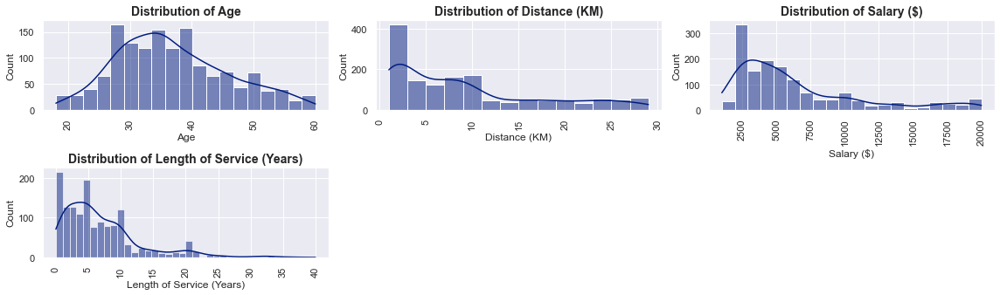

In [17]:
plt.figure(figsize=(16,9))
for o, b in enumerate(['Age', 'Distance (KM)', 'Salary ($)', 'Length of Service (Years)']):
    sns.set_palette(sns.color_palette("dark"))
    axx = plt.subplot(4,3,o+1)
    sns.histplot(x=b, data = compEDA, ax = axx,kde=True)
    sns.set_style('darkgrid')
    plt.xticks(rotation=90)
    axx.set_title(f"Distribution of {b}",fontweight = 'bold', fontsize = 14)
plt.tight_layout()


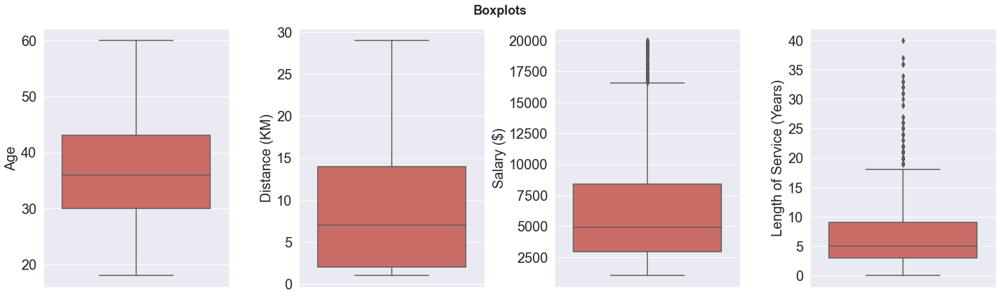

In [18]:
figout, axout = plt.subplots(1, 4, figsize=(20, 6), tight_layout = True)
for i, col in enumerate(['Age', 'Distance (KM)', 'Salary ($)', 'Length of Service (Years)']):
    axout[i].tick_params(axis='both', which='major', labelsize=20)
    sns.boxplot(data = compEDA, y=col, ax = axout[i],palette='hls')
    figout.suptitle("Boxplots",fontweight = 'bold', fontsize = 18)
    axout[i].set_ylabel(col,fontsize=20)
figout.show()

# Exploring general features

- We can see an uneven count of each class for the variable of resign status, where there are very little people who resign compared to not resigned (around 5:24 ratio). Hence, it may be hard to get a grasp of the cluster of those who resigned compared to those who did not.  Such a scenario could lead to not-so-prominent clusters. Since we want to compare the clusters characteristics, so to further understand the persona and traits of the cluster, we may need to select our clustering algorithms carefully while keeping in mind the mixed data types in the feature space. 
- We also note that there are some dominating classes with a much larger proportion count than other classes for some variables. One example is the `BusinessTravel` variable, where there are close to 1000 employees that travel rarely, as compared to 200 who do not travel, and 250 who travel frequently. This may limit the clustering algorithm to account for information of employees that do not travel or travel frequently
- Hierachical clustering may be good & relevant for this study. Some of such algorithms would be agglomerative clustering. Another approach is to select the linkage parameter for hierachical clustering. Like single link, complete link etc. We would also try density based clustering techniques such as DBSCAN 
> **General Analysis:**
- Most employees have an education level of 3, while there are very few employees with education level of 5 and 1. This may be logical as those with low education level of 1 may not fully have the expertise and skills for the job, hence employees may choose to hire those with higher educational qualifications such as Degree, PHD, etc. Moreover, education level of 5 may suggest employees have specific and specialized skillsets, hence very familiar and proficient in work related to their field. Such employees may be hard to find, which may account for the low count of employees with education level of 5
- There seems to be more male than females in this study.
- A lot more employees that are in research & development department, which may suggest a corporation that aims to develop new services or products, and improving existing ones. 
- Most employees are very satisfied with their job and feel that work life balance is generally good

Moreover, we also want to keep in mind the possible idea of selecting/removing some features to reduce the ambiguity of the clustering.
- We do not need to combine some classes as our variables generally do not have high cardinality.

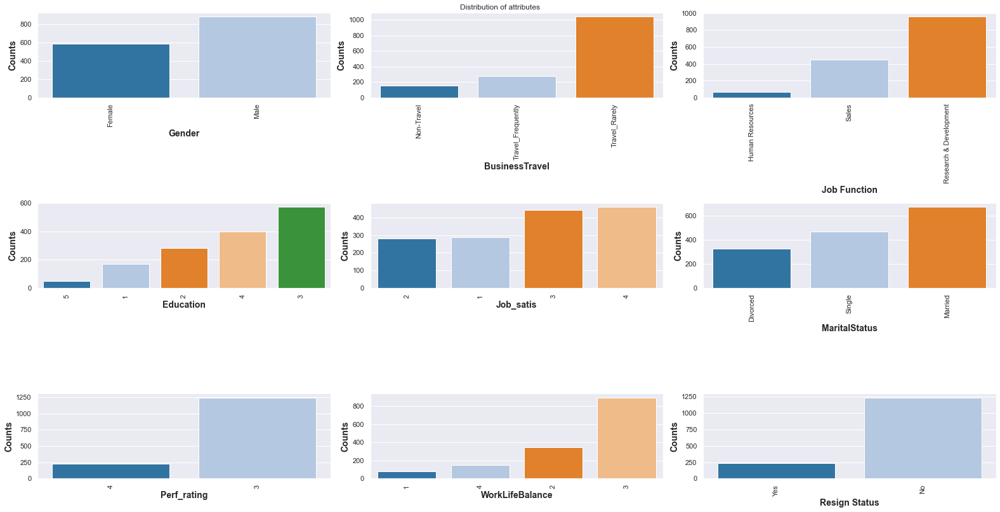

In [19]:
plt.figure(figsize = (22,15))
sns.set_palette(sns.color_palette('tab20'))
for y, f in enumerate(['Gender', 'BusinessTravel', 'Job Function', 'Education', 'Job_satis', 'MaritalStatus', 'Perf_rating', 'WorkLifeBalance', 'Resign Status']):
    axc = plt.subplot(4,3,y+1)
    order2 = compEDA[f].value_counts().sort_values()
    sns.barplot(x=order2.index, y=order2, ax =axc,order=order2.index)
    plt.xlabel(f, fontweight = 'bold', fontsize = 14)
    plt.ylabel(f'Counts', fontweight = 'bold', fontsize = 14)
   
    plt.xticks(rotation=90)
plt.suptitle('Distribution of attributes')
plt.tight_layout()

# Bivariate Analysis

## Scatter matrix of numerical variables
1. No distinctive clusters or patterns observe among the variables as shown by the scatter matrix. Most observations are close to one another and appear at random. There is no pattern in the scatterplot between variables.
2. Triangle liked shape observed between age and length of service. This is logical as length of service should not be larger than age.
3. Employees that have longer length of service tends to have higher salary.
3. There does not appear to be any visible significant relationship among most variables.
4. No extreme bivariate outliers observed among the scatter plots of variables that distorts the trend

In [20]:
fig_scatter = px.scatter_matrix(compEDA,

    dimensions=compEDA[['Age', 'Distance (KM)', 'Salary ($)', 'Length of Service (Years)']].columns,opacity=0.6,size_max=100,height=700, title='Scatter Matrix of numerical \
variables',
    )
fig_scatter.update_traces(diagonal_visible=False,showupperhalf=True, showlegend=False)
fig_scatter.show()

## Phik (𝜙k) correlation
Phik (𝜙k) is a correlation coefficient that works consistently between numerical, ordinal variables. This is very useful for this current dataset.
- The correlation ranges from 0 to 1, with 0 having no association, while 1 denoting high association
- We note that there is significant correlation between length of service and salary, with a phik correlation of 0.61. This would be logical as longer length of service will mean richer work experiences, with better and posses a variety of industry skillsets. These experienced employees are what employers are generally looking for, and are willing to pay more for the employee to work with them.
- Age is also moderately correlated with length of service having a phik correlation of 0.56. This is likely due to the fact that the longer one works for the organization, the older the person gets. In other words, they are directly proportional
- Most variables are independant of each other, denoted by its low or weak correlation.
- We might be interested in the variable of `Resign Status` as it corresponds directly to our unsupervised clustering task of understanding employees.
- We immediately note that resign status and age has significant correlation of 0.28, and salary with resign status have a correlation of 0.28, this is likely due to the fact that old age may mean leaving the organization for retirement thus resigning, whereas perhaps a lower salary may result in employee resignation for better career prospects.
- Since there is significant correlation between age and length of service, and between salary and length of service. This explains why there is also significant correlation between age and salary

interval columns not set, guessing: ['Age', 'Distance (KM)', 'Salary ($)', 'Length of Service (Years)']


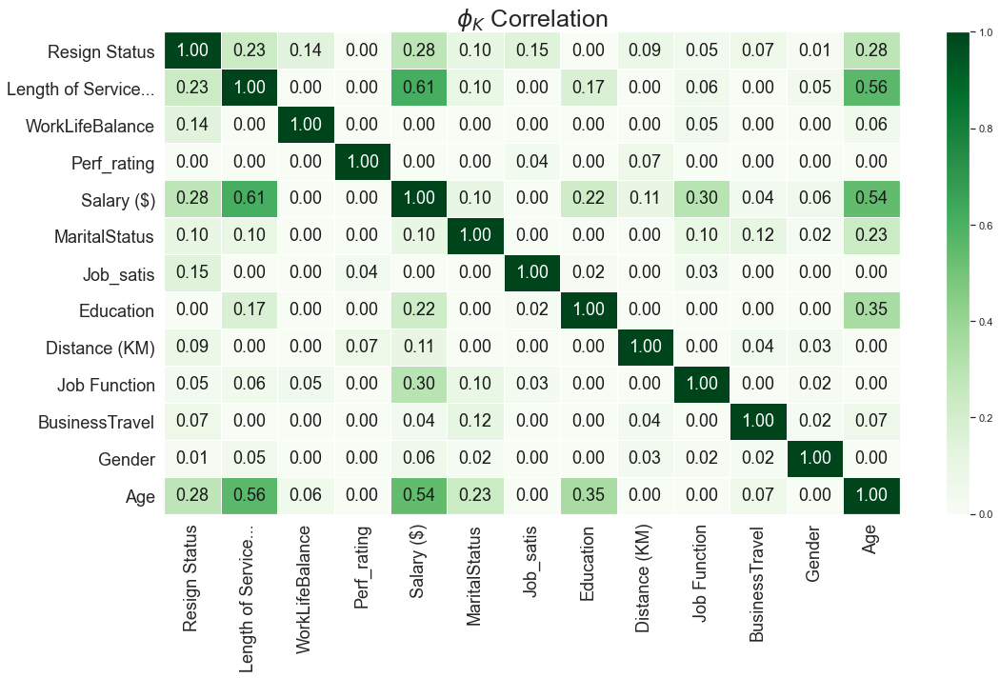

In [21]:
summary = compEDA.phik_matrix()
plot_correlation_matrix(summary.values, 
                        x_labels=summary.columns, 
                        y_labels=summary.index, 
                        vmin=0, vmax=1, color_map="Greens", 
                        title=r"$\phi_K$ Correlation", 
                        fontsize_factor=1.8, 
                        figsize=(16, 10))
plt.show()


# Violin Plots
1. Looking at the violin plots, by comparing the distributions groups by age, distance and salary, it appears there is no significant difference between the distributions of males and females.

Age attribute by categorical columns


---

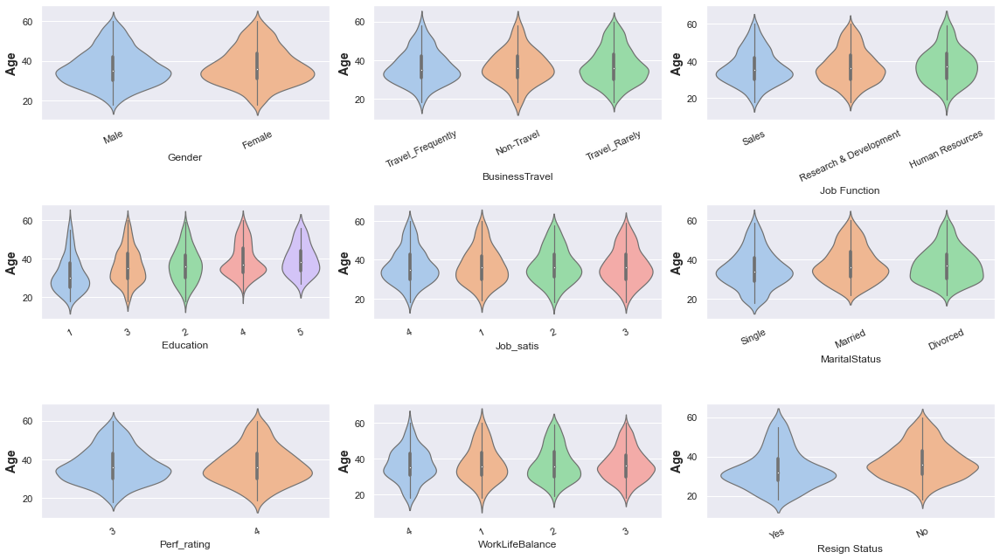

Distance (KM) attribute by categorical columns


---

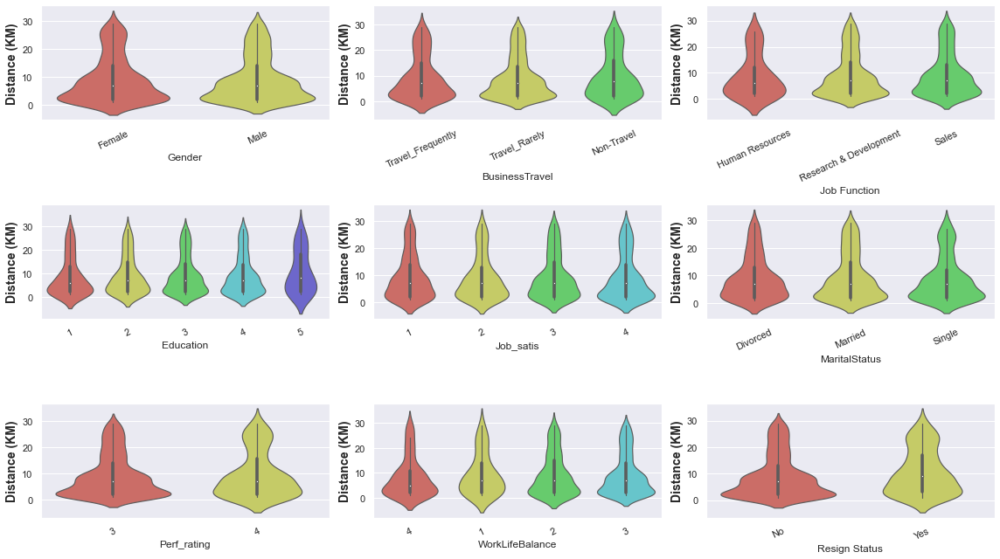

Salary ($) attribute by categorical columns


---

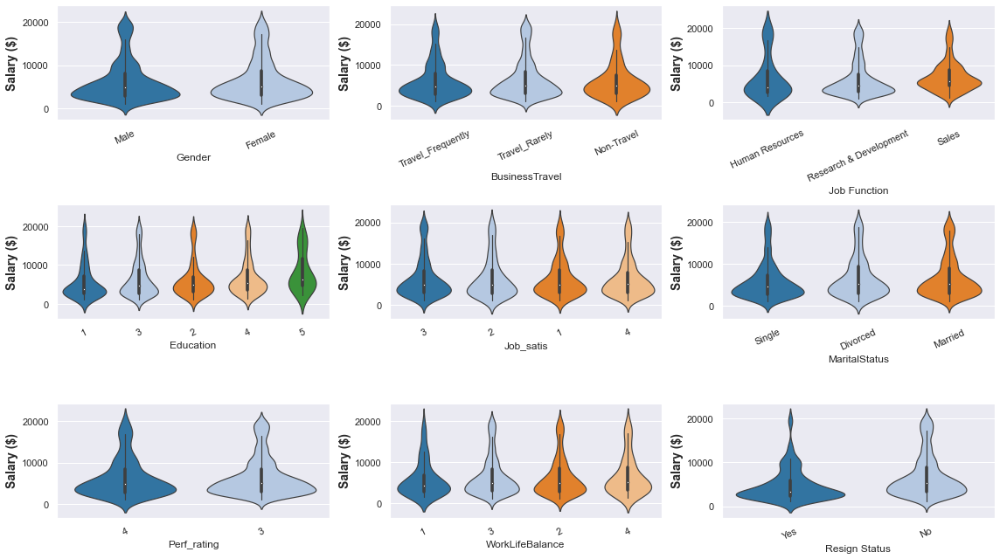

Length of Service (Years) attribute by categorical columns


---

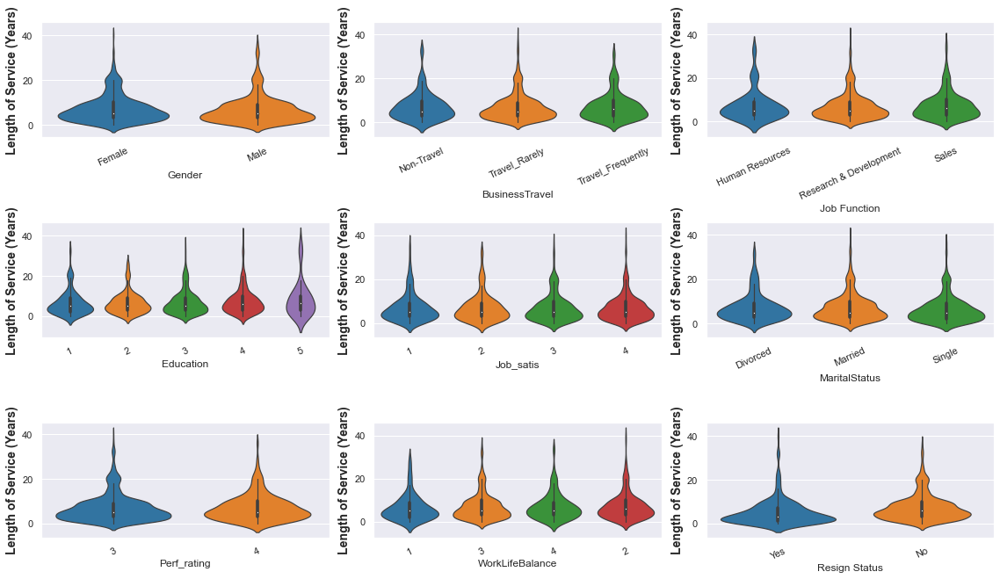

In [22]:
for int_dtype,palette in zip(compEDA.select_dtypes(include='int'), ['pastel', 'hls', 'tab20', 'tab10']):
    plt.figure(figsize=(16,9))
    for o, b in enumerate(compEDA.select_dtypes(exclude='int')):
        sns.set_palette(sns.color_palette(palette))
        axx = plt.subplot(3,3,o+1)
        orderby2 = compEDA.groupby(b)[int_dtype].median().sort_values().index
        sns.violinplot(x=b, y =int_dtype, data = compEDA, ax = axx,order=orderby2,linewidth = 1.2,flierprops = dict(marker = 'o', markersize = 2.5, linestyle = 'none', markerfacecolor = 'red', alpha = 0.75))
        sns.set_style('darkgrid')
        plt.xticks(rotation=25)
        plt.ylabel(int_dtype,fontweight = 'bold', fontsize = 14)
    print(f'{int_dtype} attribute by categorical columns')
    display(Markdown('---'))
    plt.tight_layout()
    plt.show(

        )

# Multivariate analysis
1. We note that there may be some variables that could increase the ambiguity and obscurity of clustering, hence we are skeptical in which variables are necessary for clustering.
1. Scatter matrix does not give any information that Gender is useful as there is no observed clusters or patterns to indicate whether Gender is useful.
2. Most attributes are also simlar to gender, where after grouping, they do not show any distinct clusters. And even after grouping, there seems to be overlaps of observations for each of the classes, with no clear pattern
3. Hence we will need to perform more in-depth EDA to determine which features are useful. 

In [23]:
fig_scatter = px.scatter_matrix(compEDA,

    dimensions=compEDA[['Age', 'Distance (KM)', 'Salary ($)', 'Length of Service (Years)']].columns,opacity=0.6,size_max=100,height=700, title='Scatter Matrix of numerical \
variables (choose hue below)',
    )
fig_scatter.update_traces(diagonal_visible=False,showupperhalf=True, showlegend=False)
fig_scatter.update_layout(
    updatemenus=[
        dict(
            type = "buttons",
            direction = "left",
            buttons=list([
                                dict(
                    args=[{"marker.color": [compEDA['WorkLifeBalance'].astype('category').cat.codes]}],
                    label="WL Balance",
                    method="update"
                ),
                                dict(
                    args=[{"marker.color": [compEDA['Resign Status'].astype('category').cat.codes]}],
                    label="Resign Status",
                    method="update"
                ),
                dict(
                    args=[{"marker.color": [compEDA['Perf_rating'].astype('category').cat.codes]}],
                    label="Perf_rating",
                    method="update"
                ),
                    dict(
                    args=[{"marker.color": [compEDA['Gender'].astype('category').cat.codes]}],
                    label="Gender",
                    method="update"
                ),
                dict(
                    args=[{"marker.color": [compEDA['BusinessTravel'].astype('category').cat.codes]}],
                    label="BusinessTravel",
                    method="update"
                ),
                dict(
                    args=[{"marker.color": [compEDA['MaritalStatus'].astype('category').cat.codes]}],
                    label="MaritalStatus",
                    method="update"
                ),
                dict(
                    args=[{"marker.color": [compEDA['Job_satis'].astype('category').cat.codes]}],
                    label="Job_satis",
                    method="update"
                ),
                dict(
                    args=[{"marker.color": [compEDA['Education'].astype('category').cat.codes]}],
                    label="Education",
                    method="update"
                ),

                dict(
                    args=[{"marker.color": [compEDA['Job Function'].astype('category').cat.codes]}],
                    label="Job Function",
                    method="update"
                )
            ]),
            pad={"r": 5,'t':1},
            showactive=True,
            x=0.01,
            xanchor="left",
            y=1.08,
            yanchor="top"
        ),
    ]
)
fig_scatter.show()

# t-Distributed Stochastic Neighbor Embedding
**t-SNE:**
1. `t-SNE` is an unsupervised technique used primarily for data visualization for data of high dimensionality.
2. It **cannot** be used as a dimensionality reduction technique
3. It is a non-linear method, and its goal is to preserve similarity between the data points.
2. It provides a sense of how our data is represented in high dimensional spaces. Furthermore, we need to pay attention to TSNE visualization if it shows any patterns or distinct clusters
3. The t-SNE algorithm calculates a similarity measure between pairs of instances in the high dimensional space and in the low dimensional space. It then tries to optimize these two similarity measures using a cost function.
4. t-SNE can show clear separations in the data. This can be useful before modelling, to pick the no. of cluster.
5. We need to ensure that the `perplexity` parameter carefully, as selecting too high may not serve the purpose of TSNE anymore.


**Why not use `PCA`?**
1. PCA is Principal Component analysis, is more of a dimensionality reduction technique.
2. We will not use PCA, as it may not work well with categorical data

In [24]:
class MultiColumnLabelEncoder:
    def __init__(self,columns = None):
        self.columns = columns

    def fit(self,X,y=None):
        return self 
    def transform(self,X):
        '''
        Transforms columns of X specified in self.columns using
        LabelEncoder(). If no columns specified, transforms all
        columns in df
        '''
        output = X.copy()
        if self.columns is not None:
            for col in self.columns:
                output[col] = LabelEncoder().fit_transform(output[col])
        else:
            for colname,col in output.iteritems():
                output[colname] = LabelEncoder().fit_transform(col)
        return output

    def fit_transform(self,X,y=None):
        return self.fit(X,y).transform(X)

In [25]:
tsne = Pipeline([
    ('LE',MultiColumnLabelEncoder(columns = ['BusinessTravel', 'Gender', 'Job Function', 'MaritalStatus', 'Resign Status'])),
    ('Scale', StandardScaler()),
    ('TSNE', TSNE(n_components=2,random_state=rstate,init='pca', n_jobs=-1, perplexity=40))
])
tsne_3d = Pipeline([
    ('LE',MultiColumnLabelEncoder(columns = ['BusinessTravel', 'Gender', 'Job Function', 'MaritalStatus', 'Resign Status'])),
    ('Scale', StandardScaler()),
    ('TSNE', TSNE(n_components=3,random_state=rstate,init='pca', n_jobs=-1, perplexity=40))
])
# 2d viz
tsne_df = pd.DataFrame(tsne.fit_transform(comp_df), columns=['Dimension 1', 'Dimension 2'])
# 3d viz
tsne_df3d = pd.DataFrame(tsne_3d.fit_transform(comp_df), columns=['Dimension 1', 'Dimension 2', 'Dimension 3'])
tsne_df = pd.concat([MultiColumnLabelEncoder(columns=['BusinessTravel', 'Gender', 'Job Function', 'MaritalStatus', 'Resign Status']).fit_transform(comp_df),tsne_df],axis=1)

**TSNE visualization**
- To visualize, I will label encode the categorical variables such as business travel, as TSNE does not accept strings. Furthermore, we will scale the data using standard scaler. **Note that WE ARE NOT LABEL ENCODING FOR THE CLUSTERING ALGORITHM, but for the sole purpose of grouping.**
- There seems to be 4 main clusters. 
- The main cluster on the right seems to comprise with multiple unnoticeable clusters.
- After grouping by resign status, there seems to be 2 main groups. Employees that resign seems to take the top left clusters. 
- However, grouping by other variables does not result in identifiable patterns or cluster.

In [26]:
text = 'Resign Status'
# marker= dict(color=tsne_df[text])
fig = make_subplots(rows=1, cols=2,specs=[[{'type':'xy'}, {'type':'scene'}]])
scatter_2d = go.Scatter(x=tsne_df['Dimension 1'], y=tsne_df['Dimension 2'], mode='markers',marker= dict(color=tsne_df[text]) )
fig.append_trace(scatter_2d, 1, 1)
fig.update_layout(
    xaxis_title="Dimension 1",
    yaxis_title="Dimension 2",
    legend_title="Traces",
)

scatter_3d = go.Scatter3d(
    x = tsne_df3d['Dimension 1'], y=tsne_df3d['Dimension 2'], z=tsne_df3d['Dimension 3'], mode='markers',marker=dict(
        size=12,
        opacity=0.4,
        color=tsne_df[text]
))

fig.update_layout(
    scene = dict(xaxis_title='Dimension 1',
                    yaxis_title='Dimension 2',
                    zaxis_title='Dimension 3' ),
    title="TSNE Scatter Plot Visualizations (Choose 'hue' below)",
    font=dict(
        size=12,
        color="RebeccaPurple"
    )
)
fig.update_layout(
    updatemenus=[
        dict(
            type = "buttons",
            direction = "left",
            buttons=list([
                                dict(
                    args=[{"marker.color": [tsne_df['WorkLifeBalance'].to_numpy()]}],
                    label="WL Balance",
                    method="update"
                ),
                                dict(
                    args=[{"marker.color": [tsne_df['Resign Status'].to_numpy()]}],
                    label="Resign Status",
                    method="update"
                ),
                dict(
                    args=[{"marker.color": [tsne_df['Perf_rating'].to_numpy()]}],
                    label="Perf_rating",
                    method="update"
                ),
                dict(
                    args=[{"marker.color": [tsne_df['MaritalStatus'].to_numpy()]}],
                    label="MaritalStatus",
                    method="update"
                ),
                dict(
                    args=[{"marker.color": [tsne_df['Job_satis'].to_numpy()]}],
                    label="Job_satis",
                    method="update"
                ),
                dict(
                    args=[{"marker.color": [tsne_df['Education'].to_numpy()]}],
                    label="Education",
                    method="update"
                ),
                dict(
                    args=[{"marker.color": [tsne_df['Gender'].to_numpy()]}],
                    label="Gender",
                    method="update"
                ),
                dict(
                    args=[{"marker.color": [tsne_df['BusinessTravel'].to_numpy()]}],
                    label="BizTravel",
                    method="update"
                ),
                dict(
                    args=[{"marker.color": [tsne_df['Job Function'].to_numpy()]}],
                    label="Job Function",
                    method="update"
                )
            ]),
            pad={"r": 5,'t':1},
            showactive=True,
            x=0.01,
            xanchor="left",
            y=1.15,
            yanchor="top"
        ),
    ]
)

fig.append_trace(scatter_3d,1,2)
fig.show()

# Statistical Tests

# One-way ANOVA (Analysis of variance) & Levene tests
1. ANOVA checks whether there is equal variance between groups of categorical feature with respect to the numerical response, and uses the f-tests to statistically test the equality of means.
2. If there is equal variance between groups, it means the feature has no significant difference among its groups and hence it (the categorical variable) should be seriously considered for model training

1. We want to determine if there is a significant difference between the demographics and habits such as salary/distance etc of the classes for some attributes. This may help us decide on a course of action for what to do with the feature. 
3. There also might be a possibility that the data have redundant information which means that there might be overlapping information after clustering the data. To prevent that, we have to do feature selection using ANOVA
1. ANOVA will be used as there are at least 2 unique variables in some of the categorical attributes.


2. We also have doubts whether features like `Gender`, `Perf_rating`, `WorkLifeBalance`, `Job_satis` are necessary based on EDA, and whether it provides useful information towards the clustering algorithm. 

1. The one-way ANOVA tests the null hypothesis that two or more groups have the same population mean. The test is applied to samples from two or more groups, possibly with differing sizes.
2. We will be using significance level of 0.05. If P-value < 0.05, this means that there would be evidence to reject the null hypothesis.
> One way ANOVA: 

$$\text{$H_0$: $\mu _1 = \mu _2 = \mu _3$.... $= \mu _k$ (All Population mean are equal) }$$
$$\text{$H_1$: At least 2 population mean are different (Means are not all equal)}$$

In [27]:
gender_df = compEDA.pivot(values=['Salary ($)', 'Distance (KM)', 'Age', 'Length of Service (Years)'], columns=['Gender'])
perf_df = compEDA.pivot(values=['Salary ($)', 'Distance (KM)', 'Age', 'Length of Service (Years)'], columns=['Perf_rating'])
wlb_df=compEDA.pivot(values=['Salary ($)', 'Distance (KM)', 'Age', 'Length of Service (Years)'], columns=['WorkLifeBalance'])
job_df = compEDA.pivot(values=['Salary ($)', 'Distance (KM)', 'Age', 'Length of Service (Years)'], columns=['Job_satis'])

In [28]:
def side_by_side(strings, size=100, space=4):
    strings = list(strings)
    result = []
    while any(strings):
        line = []
        for i, s in enumerate(strings):
            line.append(s[:size].ljust(size))
            strings[i] = s[size:]

        result.append((" " * space).join(line))
    
    return "\n".join(result)

> **Insights:**
- Since we want there to be distinct information in the clusters, we want to find population means that do not defer, where attributes do not have a huge influence on the distribution of data. This is so that we can handle these features later on.

In [29]:
def organize(sample1,sample2, sample3 = None, sample4 = None):
    if sample3 is not None and sample4 is not None:
        return (sample1.dropna().to_list(),sample2.dropna().to_list(), sample3.dropna().to_list(), sample4.dropna().to_list())
    else:
        return (sample1.dropna().to_list(),sample2.dropna().to_list())
f_oneway_dict = defaultdict()
names = ['Gender', 'Perf_rating', 'WorkLifeBalance', 'Job satisfaction']
for col_name,dfs in zip(names,[gender_df,perf_df,wlb_df,job_df]):
    for cols in dfs.columns.levels[0]:
        for idx,dict_cols in enumerate(dfs[cols].columns):
            
            f_oneway_dict[f'sample{idx+1}'] = dfs[cols][dict_cols]
            # display(f_oneway_dict)
        samples =organize(**f_oneway_dict)
        # display(len(samples),samples)
        display(Markdown('#### **ANOVA and Levene Test for {0} ({1}):**'.format(col_name, cols)))
        t_stat, pval = f_oneway(*samples)
        print()
        lev_stat, p_val2 = levene(*samples)
        strings = f'> ANOVA Test Statistic: {t_stat}; P-Value {np.round(pval,8)}', f'> Levene Test Statistic: {lev_stat}; P-Value: {p_val2}'
        print(side_by_side(strings,size=50,space=10))
        display(Markdown('---'))


#### **ANOVA and Levene Test for Gender (Salary ($)):**


> ANOVA Test Statistic: 1.4914802153292723; P-Valu          > Levene Test Statistic: 0.1310668994983261; P-Val
e 0.22218303                                                ue: 0.7173805016372548                            


---

#### **ANOVA and Levene Test for Gender (Distance (KM)):**


> ANOVA Test Statistic: 0.005027115460965295; P-Va          > Levene Test Statistic: 0.4611725372293803; P-Val
lue 0.94348529                                              ue: 0.49718354647528096                           


---

#### **ANOVA and Levene Test for Gender (Age):**


> ANOVA Test Statistic: 1.938048713026884; P-Value          > Levene Test Statistic: 0.44804362365389266; P-Va
 0.16409141                                                 lue: 0.5033707301597629                           


---

#### **ANOVA and Levene Test for Gender (Length of Service (Years)):**


> ANOVA Test Statistic: 1.300167734832264; P-Value          > Levene Test Statistic: 0.11160327250796881; P-Va
 0.25436858                                                 lue: 0.738373880492434                            


---

#### **ANOVA and Levene Test for Perf_rating (Salary ($)):**


> ANOVA Test Statistic: 0.4303956762361691; P-Valu          > Levene Test Statistic: 0.011650944049096857; P-V
e 0.51189767                                                alue: 0.9140584030578309                          


---

#### **ANOVA and Levene Test for Perf_rating (Distance (KM)):**


> ANOVA Test Statistic: 1.079672801560796; P-Value          > Levene Test Statistic: 1.9048962416347934; P-Val
 0.29894187                                                 ue: 0.16774143410442519                           


---

#### **ANOVA and Levene Test for Perf_rating (Age):**


> ANOVA Test Statistic: 0.005321252293872576; P-Va          > Levene Test Statistic: 0.16746688875703702; P-Va
lue 0.9418583                                               lue: 0.68243264364705                             


---

#### **ANOVA and Levene Test for Perf_rating (Length of Service (Years)):**


> ANOVA Test Statistic: 0.0173227386325178; P-Valu          > Levene Test Statistic: 0.07623385957658844; P-Va
e 0.89530616                                                lue: 0.7825064389172516                           


---

#### **ANOVA and Levene Test for WorkLifeBalance (Salary ($)):**


> ANOVA Test Statistic: 0.6123542986718447; P-Valu          > Levene Test Statistic: 0.3824216911899887; P-Val
e 0.60701616                                                ue: 0.7656919577757718                            


---

#### **ANOVA and Levene Test for WorkLifeBalance (Distance (KM)):**


> ANOVA Test Statistic: 0.7392739389634323; P-Valu          > Levene Test Statistic: 0.4466432078452627; P-Val
e 0.52862699                                                ue: 0.719710642675266                             


---

#### **ANOVA and Levene Test for WorkLifeBalance (Age):**


> ANOVA Test Statistic: 0.23504533575423875; P-Val          > Levene Test Statistic: 1.251102514497136; P-Valu
ue 0.87197857                                               e: 0.28978079241559845                            


---

#### **ANOVA and Levene Test for WorkLifeBalance (Length of Service (Years)):**


> ANOVA Test Statistic: 0.33527707903214077; P-Val          > Levene Test Statistic: 0.25669683784245684; P-Va
ue 0.79984147                                               lue: 0.856592420970133                            


---

#### **ANOVA and Levene Test for Job satisfaction (Salary ($)):**


> ANOVA Test Statistic: 0.027038829545482108; P-Va          > Levene Test Statistic: 0.2954627286882086; P-Val
lue 0.99400017                                              ue: 0.8287030872048975                            


---

#### **ANOVA and Levene Test for Job satisfaction (Distance (KM)):**


> ANOVA Test Statistic: 0.18657749054436545; P-Val          > Levene Test Statistic: 0.18294353690827334; P-Va
ue 0.90556662                                               lue: 0.908020827220994                            


---

#### **ANOVA and Levene Test for Job satisfaction (Age):**


> ANOVA Test Statistic: 0.051798411447326435; P-Va          > Levene Test Statistic: 0.17521339523618823; P-Va
lue 0.98444031                                              lue: 0.9132044287318283                           


---

#### **ANOVA and Levene Test for Job satisfaction (Length of Service (Years)):**


> ANOVA Test Statistic: 0.033557520533201386; P-Va          > Levene Test Statistic: 0.18243989948579986; P-Va
lue 0.99175288                                              lue: 0.9083601063341039                           


---

# Data Preprocessing

1. In a general machine learning supervised learning task, we would have to either ordinal encode ordinal features or one hot encode nominal features. However, we cannot do the same thing for this study. I will explain below.
1. I want to highlight the slight problem of having categorical attributes such as `MaritalStatus` for our clustering task. For example, after we label encode the attribute, certain clustering algorithms like K-Means along with euclidean distance may not be very ideal or even make sense, as we cannot measure and fathom the euclidean distance between `Single`, `Divorced` and `Married` marital status. The derived cluster centers may not be logical as well. Furthermore, when we label encode, if marital status of single takes on value of 1, divorced takes 2, and married takes 3, our algorithm may think that single (1) is actually closer or similar to divorced (2) than it is to married (3). This does not make sense.
5. This highlights why Label encoding is illogical and we will not use label encoding convert labels to numeric format for modelling.
6. Next, we note that we have a slightly large feature space and directly one hot encoding where we convert each categorical value into a new categorical column and assign a binary value of 1 or 0 to those columns, may not be a good idea, as one hot encoding produces sparse matrix, which can be a problem for some algorithms that are sensitive to data sparsity. 
6. And we need to note that the dimension of the input space increases with the cardinality of our encoded variable, all of such problems brings about the issue of the curse of dimensionality. In such problems, euclidean distance might not work very well, since it would have difficulty in measuring all the small distances in a very large space that only gets larger. This is because euclidean distance approach has difficulties working with the data sparsity.
7. Hence, to summarize such transformations can lead the clustering algorithms to misunderstand these features and create meaningless clusters, distance based clustering techniques may also not work very well under high dimensionality spaces. 

>- Hence, one hot encoding and label encoding is out of the question, and to deal with this, we need to brainstorm further, since one of the most commonly used distance metric: Euclidean distance is not appropriate in this scenario. I will be exploring different methods to tackle this issue during modelling
> - Hence our data preprocessing steps would only consist of scaling and dropping of some features.
> - From EDA just now, we note that some attributes have uneven classes, we can counter this by using hierarchical clustering.

### So what to do?

> **Datatypes of attributes**
- As seen from EDA, we have several different types of attributes for us to handle.

| Datatype | What to do? | Attribute names|
|---|---|---|
| Numerical | Feature Scaling  | `Distance (KM)`, `Length Of Service (Yrs)`, `Salary ($)`, `Age` |
| Categorical-Ordinal | I will explain later on | `Education`, `Job_satis`, `Perf_rating`, `WorkLifeBalance`  |
| Categorical-Nominal | For now, I will be leaving categorical variables as it is, and I will explain how we should handle it later. | `BusinessTravel`, `Job Function`, `MaritalStatus`, `Resign Status`, `Gender` |



1. We will drop some columns for preprocessing. Namely, the ones below. 
2. Next, we will discuss scaling methods, but before that we need to recognize the importance of feature scaling. That is: numerical features in the final dataset that is used for clustering must be on the same scale for each numerical feature to be treated equally by the distance metrics when measuring similarities. Such will allow no statistical bias between features within the clustering algorithm. Hence, we need to perform normalization.
> **Why Normalization?**
3. There are some algorithms such as K-Prototypes that require a different type of scaling namely normalization using `MinMaxScaler()`, min max scaler is able to bring the numerical features within range of [0,1]. 
$$X_{Normalized} = \frac {X_i - X_{min}} {X_{max} - X_{min}}$$
4. I will perform scaling individually later for each algorithm in a function.

In [30]:
dropped_cat_cols = [ 'Job_satis', 'WorkLifeBalance', 'Gender', 'Perf_rating' ]
num_cols = ['Salary ($)', 'Length of Service (Years)', 'Age', 'Distance (KM)'] #denote continuous cols

In [31]:
comp_df.drop(columns=dropped_cat_cols,inplace=True)

#### Feature Engineering (Normalization Visualization)
1. We will see how standard scaler transforms our data.
2. Before scaling, magnitudes of certain variables are too small compared to salary.
2. After scaling, we note variables follow similar magnitudes and scale, which is a good thing. Variables are of range [0,1]
3. Original distribution is preserved, similar to what we saw during EDA

In [32]:
def custom_scaling(df, int_cols, scale=MinMaxScaler) -> Tuple[pd.DataFrame]:
    """
    Returns a dataframe with numerical features scaled.
    """
    X = df.copy()
    for c in int_cols:
        # perform scaling on numerical cols
        pt = scale()
        X[c] =  pt.fit_transform(np.array(X[c]).reshape(-1, 1))
    return X

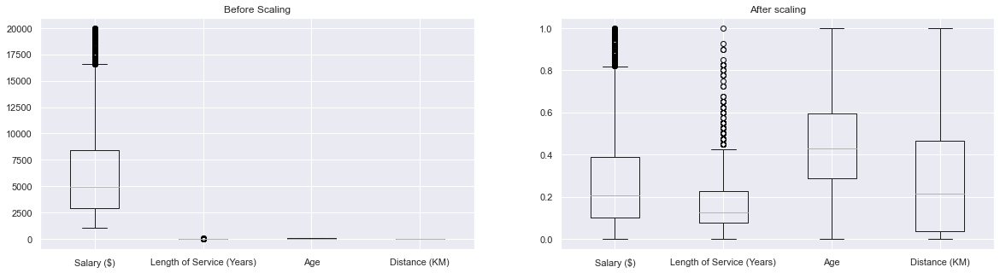

In [33]:
scale_copy=comp_df.copy()
scale_copy = custom_scaling(scale_copy, scale=MinMaxScaler, int_cols=num_cols)

fig, axes = plt.subplots(ncols=2, figsize=(20, 5), sharey=False)
comp_df[num_cols].boxplot(ax=axes[0])
scale_copy[num_cols].boxplot(ax=axes[1])

axes[0].set_title('Before Scaling')
axes[1].set_title('After scaling')
plt.show()

# Modelling

## How do we determine how good our clustering technique is?
- Firstly, we want to have an algorithm that can provide us with somewhat distinguishable and explicable clusters.
- To select the best model, we will need a way to evaluate the models performance. However, clustering is an unsupervised task, so we do not have the target variable. We can use silhouette scores,etc. We could consider common clustering metrics like Davies-Bouldin Index which is defined as average similarity measure of each cluster with its most similar cluster, where similarity is the ratio of within-cluster distances to between-cluster distances. However, Davies Bouldin score may not be very relevant as our data has nominal variables, and hence the metric would not be used. The usage of centroid distance limits the distance metric to Euclidean space.
- Furthermore, we want data points in the cluster to be similar to each other, and dissimilar from data points assigned to other clusters. Typically, the similarity measure is calculated using euclidean distance for numerical, and Jaccard for categorical. However in this case, we have mixed data types. Hence I will explain a special metric used later.
> #### 1. **Ideas behind Silhouette Coefficient**
- _Cohesion_: Average distance of x to all other vectors in the same cluster. This measures how closely related are
the points in a cluster
- _Separation_: Average distance of x to other vectors in other clusters. Then take minimum among the clusters. This measures how distinct or wellseparated a cluster is from other clusters
> #### **FORMULA:**

$$s = \frac{b-a}{max(a,b)} $$

$$\text{where $a$ = Average distance between each instance within a cluster. (mean intra-cluster distance), } \\

\text{$b$= Average distance between all clusters. (measure the distance of points of different clusters.) }$$ 
---
- The silhouette score has a range of [-1,+1], with 1 being the best.
    - (Near) 1: Means clusters are well apart from each other and clearly distinguished.
    
    - 0: Distance between clusters is not significant.

    - (Near) -1: Means clusters are assigned in the wrong way. It may suggest that the samples has been assigned to the wrong cluster
- Silhouette scores is also a good metric especially for high dimensional data. However, since we have several ordinal categorical variable and numerical variables, a special distance metric is more suitable, we do this by specifying `metric=precomputed` in sklearn's silhouette score. We cannot use the default euclidean. Instead we will use Gower's distance.
> #### 2. **Gower Distance**

![title](https://miro.medium.com/max/440/1*0k6YFgMc-SF8qLlJlzTJHg.png)
1. Specialized hybrid distance for mixed data types
2. Gower’s Distance can be used to measure how different records (dissimilarity) are. The records may be of a combination of categorical, numerical or text data.
3. The distance is always a number between 0 (identical) and 1 (maximally dissimilar).
4. Gower’s distance is computed as the average of partial dissimilarities across individuals
4. The metric for each data type is explained below
    - Quantitative (numerical): range-normalized Manhattan distance
    - Ordinal: variable is first ranked, then manhattan distance is used with a special adjustment for ties
    - Nominal/Qualitative/Categorical variables: variables of k categories are first converted into k binary columns and then the _Dice_ coefficient is used, the distance is 1 if the categories between two records are different and the distance is 0 if the categories are the same. In other words, dice distance is used for measuring similarity.
    
$$DICE = \frac{2|X \cap Y|}{|X|+|Y|} = \frac{2TP}{2TP+FP+FN}$$
5. We will implement gower dissimilarity using gower library to calculate dissimilarirties between employees.
6. Ideally, using the gower_matrix function provided where we set the parameter `cat_features` to our categorical variables, we will get a dissimilarity matrix. With this, We can apply techniques like hierarchical clustering (e.g. AgglomerativeClustering) on the matrix, where the algorithm computes the dissimilarity between all pairs of clusters, then merge the two clusters that are least dissimilar as measured by the dissimilarity metric. To do this, we can use sklearn's agglomerative clustering, by setting `affinity= 'precomputed'`, and tinkering with the linkage criterions.
> #### 3. **Calinski-Harabasz index**
- Also known as the Variance Ratio Criterion
- Measures the ratio of the sum of between-clusters dispersion and of inter-cluster dispersion for all clusters, the higher the score , the better the performances
- One drawback is that Calinski-Harabasz index is generally higher for convex clusters than other concepts of clusters, such as density based clusters like those derived through DBSCAN.
> **Note that higher the Calinski Harabasz score indicate better performance suggesting clusters are dense and well separated.**
> [Source](https://medium.com/analytics-vidhya/gowers-distance-899f9c4bd553)

> ### **Feature Engineering**
1. We recall that we have a special scenario of having ordinal categorical data. We need to treat ordinal categorical data as numerical data due to the following reasons:
    - For instance, education attribute is ordinal in nature, an education level of 5 is higher than education level of 1. Moreover, the difference between education level 1 and 2 is different from the difference between education level 1 and 5. We could say that 1 is more different than 3 as compared to 2. This is the problem with ordinal variables, where the difference between unqiue categories is _different_
    - Furthermore, since gower distance uses the dice distance as a metric for calculation of dissimilarity for qualitative records, the distance is 1 if categories between 2 records are different, and 0 if categories are the same. This suggest that dice coefficient would be reliable only for data that cannot be ranked (difference between categories of an attribute are the same).
    - Given this, we need to think of a way to account for the order difference.
    - Hence we must cannot treat ordinal categorical variables the same as nominal categorical variable. Instead, we must treat them as numerical variables. In this case, the `Education` variable is first ranked, and then manhattan distance is computed, similar with quantitative variables, but with the special adjustment for ties.
2. We also recall that we left the nominal categorical attributes as it is. This is because algorithms we will be using later such as K prototypes allows us to specify the categorical columns through `categorical` parameter. Furthermore, when calculating the dissimilarity matrix using gower library, we can also easily set the `cat_features` parameter to our categorical attributes.

In [34]:
int_cols = ['Salary ($)', 'Length of Service (Years)', 'Age', 'Distance (KM)', 'Education']
select_cols = list(set(comp_df.columns) - set(dropped_cat_cols) - set(int_cols))
# Select non dropped categorical cols
cat_cols = [comp_df.columns.get_loc(c) for c in select_cols]
# Get location of the selected categorical columns

## Selecting the number of clusters with silhouette analysis
- Silhouette analysis can be used to study the separation distance between the resulting clusters. 
- It helps us choose an optimal value for n_clusters. The silhouette plot displays a measure of how close each point in one cluster is to points in the neighboring clusters and thus provides a way to assess parameters like number of clusters visually. Also from the thickness of the silhouette plot the cluster size can be visualized. 
- To facilitate silhouette analysis, we need to reduce the dataset dimensions so that we can plot it out.
- Hence, we can use several methods such as PCA or FAMD.
> **PCA:**
- Principal component analysis is an unsupervised clustering method which maps the original data space into a lower dimensional space.
- PCA finds a subspace that most preserves the data variance, with the subspace defined by the dominant eigenvectors of the data’s covariance matrix. PCA helps us derive components that explains most of the variability of the dataset. That is preserving maximum variability. The new components can be considered as linear combinations of the original values. It is always recommended to perform PCA on dataset with continuous variables only. _However, our dataset has a mixed of categorical and numerical, hence PCA is not relevant here. What about FAMD?_
> **FAMD:**
- FAMD is useful tool for analysing data with continuous and categorical features.
- Since it is not recommended to one hot encode or label encode categorical data, we will use FAMD to aid us in investigating the results of clustering
- Factor analysis of mixed data does the analysis with a combination of PCA and MCA techniques. MCA stands for multiple correspondence analysis, which is suitable for categorical data. We can use FAMD technique for dimension reduction.
- The categorical variables are transformed into a disjunctive data table and then scaled using the specific scaling of MCA. This ensures to balance the influence of both continous and categorical variables in the analysis. It means that both variables are on a equal foot to determine the dimensions of variability. [Source](https://www.rdocumentation.org/packages/FactoMineR/versions/2.4/topics/FAMD)
- Note that we need to scaling numerical variables before using FAMD. This is critical for valid results. However, prince library already performs scaling for us as seen from documentation.

#### We will be applying the clustering technique on the raw data then using Factor Analysis of Mixed Data via the `prince` library to visualize the clusters. Note that we are not clustering on the output of FAMD.

**Visualize clusters from clustering (3d) by plotting scatter plot and silhouette diagram**

> **How do we evaluate our clustering techniques?**
1. We will use gower distance to determine the quality of clusters formed by the algorithm. Specifically, we will use `gower_matrix` function to convert the original dataframe into a gower matrix, then specify `silhouette_score(gower_matrix,metric='precomputed')`. We pass a gower distance matrix inside sklearn silhouette scores function. We also need to specify `metric='precomputed'` as we are passing the distance array itself. Hence, this will compute the silhouette score.
2. Since `gower_matrix` from the gower library already helps us scale our numerical variables, we will not need to perform scaling

In [35]:
def cluster_visualization(X:Sequence,n_clust, model = None, metric='precomputed') -> Tuple[pd.Series]:
    """
    Plots 3d scatter plot and silhouette diagram
    """
    df = X.copy()
    # Create a subplot with 1 row and 2 columns
    fig = make_subplots(rows=1, cols=2,specs=[[{'type':'xy'}, {'type':'scene'}]],subplot_titles=('Silhouette Diagram', '3d Scatter plot visualization with clusters using FAMD'))
    if n_clust is None:
        # For models that do not require us to specify clusters
        _, cluster_labels, centroids, mod = model(X)
    else:
        # Models that need clusters
        _, cluster_labels, centroids, mod = model(n_clust,df)

# Get cluster labels
    df['Labels'] = cluster_labels

    if metric== 'precomputed':
        input_df = gower_matrix(df,cat_features=[col in select_cols for col in df.columns])

    
    # Calculate silhouette score based on gower matrix.
    silhouette_avg = silhouette_score(input_df, cluster_labels, metric=metric)
    sample_silhouette_values = silhouette_samples(input_df, cluster_labels, metric=metric)
    print('calinski_harabasz_score',calinski_harabasz_score(input_df,cluster_labels))
    print(
        
        "For n_clusters =",
        n_clust,
        "The average silhouette_score is :",
        silhouette_avg,
    )

    try:
        print('Clustering cost: sum distance of all points to respective cluster centroids', mod.cost_)
    except:
        pass
    # Clustering cost, defined as the sum distance of all points to their respective cluster centroids.

    y_lower=10
    for i in range(n_clust):
        cluster_silhouettes = sample_silhouette_values[cluster_labels == i]
        cluster_silhouettes.sort()
        cluster_size = cluster_silhouettes.shape[0]
        y_upper = y_lower + cluster_size
        colors = sns.color_palette('tab10')
        filled_area = go.Scatter(y=np.arange(y_lower, y_upper),
                                 x=cluster_silhouettes,
                                 mode='lines',
                                 showlegend=False,
                                 line=dict(width=0.5,
                                          color=f'rgb({colors[i-1][0] * 255}, {colors[i-1][1] * 255}, {colors[i-1][2] * 255})' ),
                                 fill='tozerox')
        y_lower = y_upper + 10
        fig.append_trace(filled_area, 1, 1)
        fig['layout']['yaxis1'].update(title='Cluster label',
                                   showticklabels=False,
                                   range=[0, len(X) + (n_clust + 1) * 10])

    # FAMD SECTION
    X_famd = X.copy()
    dim_red = FAMD(random_state=rstate, n_components=3)
    sample = dim_red.fit_transform(X_famd )
    # Rename to facilitate plotting
    try:
        sample.rename({0:'Dimension 1', 1: 'Dimension 2', 2:'Dimension 3'},axis=1,inplace=True)
        sample['Labels'] = df['Labels']
        cluster_centroids = sample.groupby('Labels').mean()
    except:
        pass

    # Scatter plot 3d
    sc = go.Scatter3d(x= sample['Dimension 1'], y= sample['Dimension 2'], z=sample['Dimension 3'],mode='markers',marker=dict(opacity=0.5,color= sample['Labels'] ) )
    fig.append_trace(sc, 1, 2)
    centers = go.Scatter3d(x=cluster_centroids['Dimension 1'], 
                         y=cluster_centroids['Dimension 2'],
                         z=cluster_centroids["Dimension 3"],
                         showlegend=False,
                        mode='markers', marker=dict(symbol='diamond', color='black',size=12,opacity=.7)
                        )
    fig.append_trace(centers,1,2)
    avg_line = go.Scatter(x=[silhouette_avg] * 5300, y=np.arange(50000), showlegend=False, mode='lines', line=dict(color='red', dash='dash', width=1), fill='tozeroy')
    fig.append_trace(avg_line, 1, 1)
    fig.update_layout(
    scene = dict(xaxis_title='Dimension 1',
                    yaxis_title='Dimension 2',
                    zaxis_title='Dimension 3' ),
    title=f"3D Visualizations for {n_clust} clusters with {type(mod).__name__}",
    font=dict(
        size=12,
        color="RebeccaPurple"
    )
)
    fig.show()
    return cluster_labels

#### General functions to get infomation regarding each cluster
- Since we are also concerned with regards to the interpretability of the clusters formed, I will use a series of visualizations, namely the pair plot and bar graph. I will also be including descriptive statistics such as the mode/mean of the attributes in the cluster, so as to better understand the characteristics of the cluster
- We will be plotting a pair plot and using pandas `.agg()`

In [36]:
def bar_plot(df):
    fig = plt.figure(figsize = (22,15))
    for cnt,i in enumerate(int_cols):
        axc = plt.subplot(4,3,cnt+1)
        sns.barplot(y=i,x = 'Clusters', data=df, ax=axc, estimator=np.mean)
    return fig

In [37]:
def get_cluster_info(df, lbls, int_cols = int_cols):
    eval_df = df.copy(deep=True)
    eval_df['Clusters'] = lbls
    cluster_info= eval_df.groupby('Clusters').agg(
            {
                'Age':'mean',
                'Resign Status': lambda x: x.value_counts(sort=True).index[0],
                'MaritalStatus': lambda x: x.value_counts(sort=True).index[0],
                'Education': lambda x: x.value_counts(sort=True).index[0],
                'Job Function': lambda x: x.value_counts(sort=True).index[0],
                'Distance (KM)': 'mean',
                'Length of Service (Years)': 'mean',
                'Salary ($)': 'mean',
            }
        ).reset_index()
    cluster_info['Cluster Size (% of Total)'] = pd.Series(eval_df['Clusters']).value_counts() / len(eval_df['Clusters']) * 100
    cluster_info.set_index('Clusters', inplace=True)
    display(Markdown('#### **Cluster Info**'))
    display(cluster_info)
    sns.pairplot(eval_df[int_cols + ['Clusters']], hue='Clusters', corner=True, palette="tab10")
    plt.show()
    return eval_df   

# Model Selection

# K-Prototypes
- One of the conventional clustering methods commonly used in clustering tasks and efficiently used for large datasets is the K-Means algorithm. However, its method is not very suitable for data that contains categorical variables. This problem happens when the cost function in K-Means is calculated using the Euclidian distance that is only suitable for numerical data. 
- We have a special scenario where our data contains categorical variables and numerical variables.

- This is where K-Prototypes come into play, where the algorithm is able to handle mixed data types. K-Prototype is a clustering method based on partitioning. Its algorithm is an improvement of the K-Means and K-Mode clustering algorithm.
- The K-prototypes algorithm requires us to specify the categirical attributes. **We also note that we need to scale the numerical variables before fitting the data.**

- Finally, instead of calculating the within the sum of squares errors (WSSE) with euclidian distance, K-Prototype provides clustering cost that combines the calculation for numerical and categorical variables. The cost is defined as the sum distance of all points to their respective cluster centroids.
> **How does K-prototypes work?**
1. We select _k_ prototypes from dataset, one for each cluster, then allocate each instance to a cluster whose prototype is the nearest to it. This allocation is done with considering the dissimilarity measure which is described next. After all instances have been allocated to a cluster, retest the similarity of objects against the current prototypes. If we find that an object is found such that its nearer to another cluster prototype, update the prototypes of both the clusters. We repeat this step until there is no changes in clusters. 
2. It measures distance between numerical features using Euclidean distance (like K-means) but also measure the distance between categorical features using the number of matching categories.

In [38]:
def k_prototypes(n_clusters,X:Sequence, init='Cao'):
    df = X.copy()
    # Define categorical and int variables
    cat_name=select_cols
    # display(cat_name)
    cat_cols = [df.columns.get_loc(c) for c in cat_name]

    # Perform minmax scaling
    df = custom_scaling(df, int_cols=int_cols)
    
    k_pro = KPrototypes(n_clusters=n_clusters,max_iter=1000, random_state=rstate, init=init, n_jobs=-1)
    k_pro.fit(df, categorical=cat_cols)
    lbls = k_pro.predict(df, categorical=cat_cols)
    return None, lbls,k_pro.cluster_centroids_, k_pro

### K-prototypes Clustering results and cluster information

1. Use of default `n_clusters = 8` parameters.
2. Perform min max scaling (normalization) on numerical features before fitting k prototypes

In [43]:
lbls = cluster_visualization(X=comp_df,n_clust=8, model=k_prototypes)

calinski_harabasz_score 122.94337693834616
For n_clusters = 8 The average silhouette_score is : 0.21418652
Clustering cost: sum distance of all points to respective cluster centroids 373.6886308016078


From the silhouette diagram and scatter plot, we note
- Cluster sizes are not all even, some clusters are too small, which may suggests there are too many clusters
- There are some clusters that have negative silhouette score, which may suggest that data point is assigned to the wrong cluster. 
- Clusters generally seem to be quite close to each other and possibly overlapping, this is likely due to the large dataset size.
- Sum distance of all points to respective cluster centroids is moderately low
- We will need to opt for model improvement later on.

#### **Cluster Info**

,Age,Resign Status,MaritalStatus,Education,Job Function,Distance (KM),Length of Service (Years),Salary ($),Cluster Size (% of Total)
Clusters,,,,,,,,,
0,37.218182,No,Married,4,Research & Development,5.065455,5.269091,4324.501818,18.707483
1,31.076087,No,Single,2,Sales,19.565217,4.804348,4905.608696,6.258503
2,34.950249,No,Single,3,Sales,6.109453,6.825871,6376.517413,13.673469
3,33.751037,No,Single,3,Research & Development,5.502075,5.568465,4368.908714,16.394558
4,33.811404,No,Married,1,Research & Development,5.285088,5.535088,4644.513158,15.510204
5,35.354497,No,Married,3,Research & Development,22.132275,5.952381,4527.121693,12.857143
6,48.632353,No,Married,3,Research & Development,22.911765,12.558824,12645.720588,4.625850
7,47.312500,No,Married,3,Research & Development,4.659091,13.954545,15964.113636,11.972789


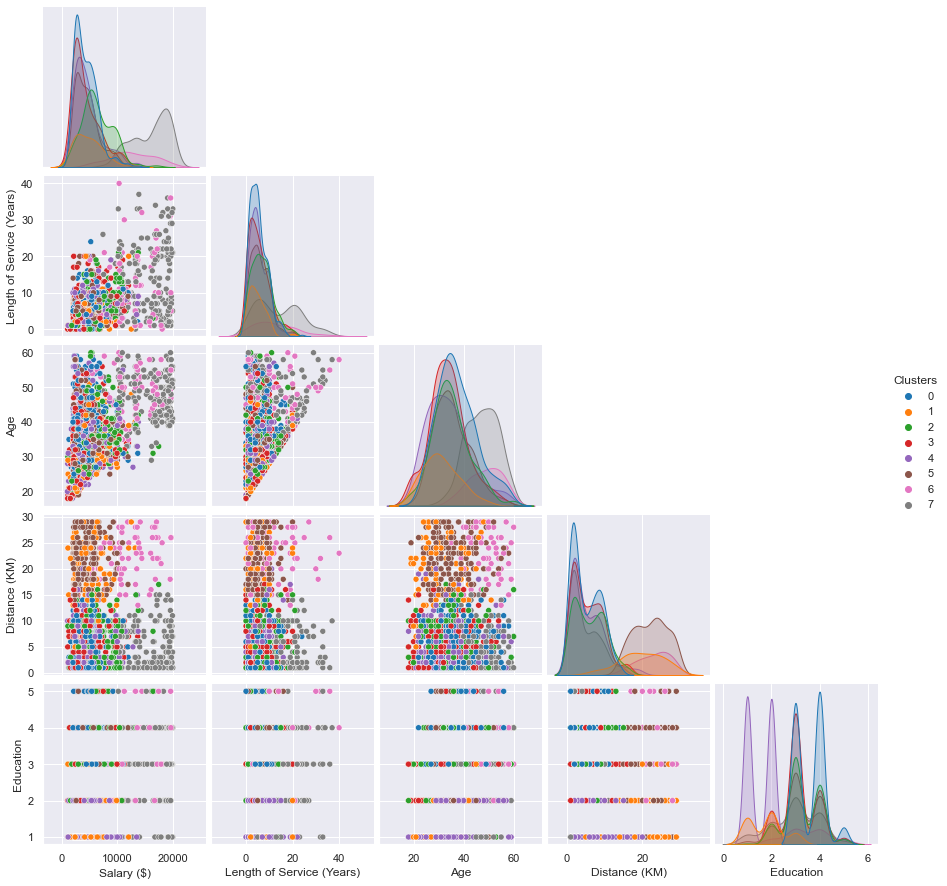

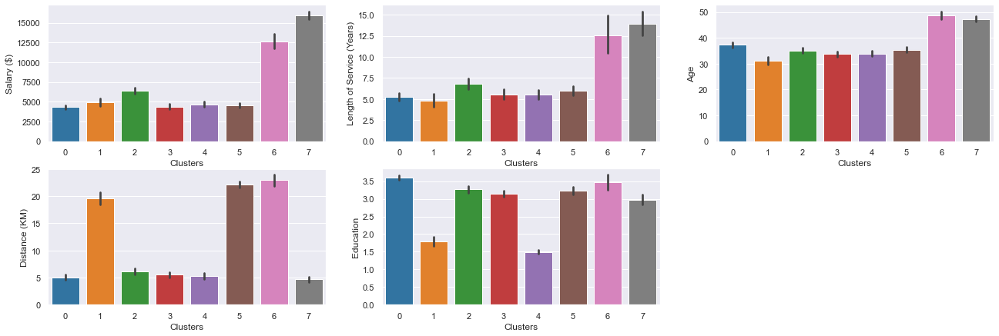

In [44]:
df_to_plot = get_cluster_info(comp_df,lbls)
bar_plot(df_to_plot)
plt.show()

Cluster 2 seems to describe employees that have very high length of service.
Cluster 2 and 6 seems to describe employees that have high salary of over 15000.

# Hierarchical Clustering (Agglomerative Clustering)

##### Use of default 2 clusters.

> **General Idea of Agglomerative Clustering:**
1. Agglomerative Clustering is a bottom up approach where we start off with many small clusters and merge them together to create bigger clusters. This can be useful as clustering may correspond to meaningful taxonomies. 
2. _TLDR:_ Recursively merges pair of clusters of sample data

> **How Agglomerative Clustering works:**
1. Agglomerative Clustering starts from an individual cluster group (N groups), (each data instance is considered as an individual cluster, aka leaf), then two most similar data points merges with each other to form a cluster. The two clusters with the shortest distance with each other would merge creating what we called node. 
2. The process is repeated until all the data points assigned to one cluster called root.
> **Linkage Criteria**
1. There are several linkage criteria for us to choose from.
    - `Single` linkage - aka NearestNeighbors, refers to distance between two clusters being the shortest distance between two points in each cluster
    - `Complete` linkage - refers to distance between two clusters being the longest distance between two points in each cluster.
    - `Average` linkage - refers to distance between clusters being the average distance between each point in one cluster to every point in other cluster
    - `Ward` linkage - refers to distance between clusters being the sum of squared differences within all clusters

> [Source](https://scikit-learn.org/stable/modules/generated/sklearn.cluster.AgglomerativeClustering.html) + [Source](https://towardsdatascience.com/machine-learning-algorithms-part-12-hierarchical-agglomerative-clustering-example-in-python-1e18e0075019)

> **What do we do?**
- Since we are aiming for explicability, hierarchical clustering would be useful.
- Use of default 2 clusters
- We will set `affinity= 'precomputed'`, as we are fitting a gower matrix. We cannot use the default `euclidean`
- The linkage parameter determines which distance to use between sets of observation. The algorithm will merge the pairs of cluster that minimize this criterion.
- Set `linkage = complete`, that uses the maximum distances between all observations of the two sets. This is because the default ward can only work with euclidean distances, which does not make sense in our scenario

![Hello](https://miro.medium.com/max/1050/1*RgJZRDA5MR7SPlGSAVsCaw.png)



In [45]:
def agglomerative_cluster(n_clusters: int, X: Sequence) -> Tuple[int, Sequence, Sequence, sklearn.cluster.AgglomerativeClustering,Sequence]:
    """
    Returns no. of cluster, labels, centroids, and labels for agglo clustering
    """
    agglo = AgglomerativeClustering(n_clusters = n_clusters, affinity= 'precomputed', linkage= 'complete')
    df = X.copy()
    df = gower_matrix(df,cat_features=[col in select_cols for col in df.columns])
    cluster_lbls = agglo.fit_predict(df)
    try:
        centroids = df.groupby(cluster_lbls).mean()
    except:
        centroids = np.nan
    return agglo.n_clusters_, cluster_lbls, centroids ,agglo

### Cluster Analysis for agglomerative clustering

In [45]:
lbls = cluster_visualization(X=comp_df,n_clust=2, model=agglomerative_cluster)

calinski_harabasz_score 671.5873553079931
For n_clusters = 2 The average silhouette_score is : 0.29972622


#### **Cluster Info**

,Age,Resign Status,MaritalStatus,Education,Job Function,Distance (KM),Length of Service (Years),Salary ($),Cluster Size (% of Total)
Clusters,,,,,,,,,
0,38.123506,No,Married,3,Research & Development,9.061753,7.768924,7261.814741,68.29932
1,34.339056,No,Single,4,Research & Development,9.474249,5.369099,4867.912017,31.70068


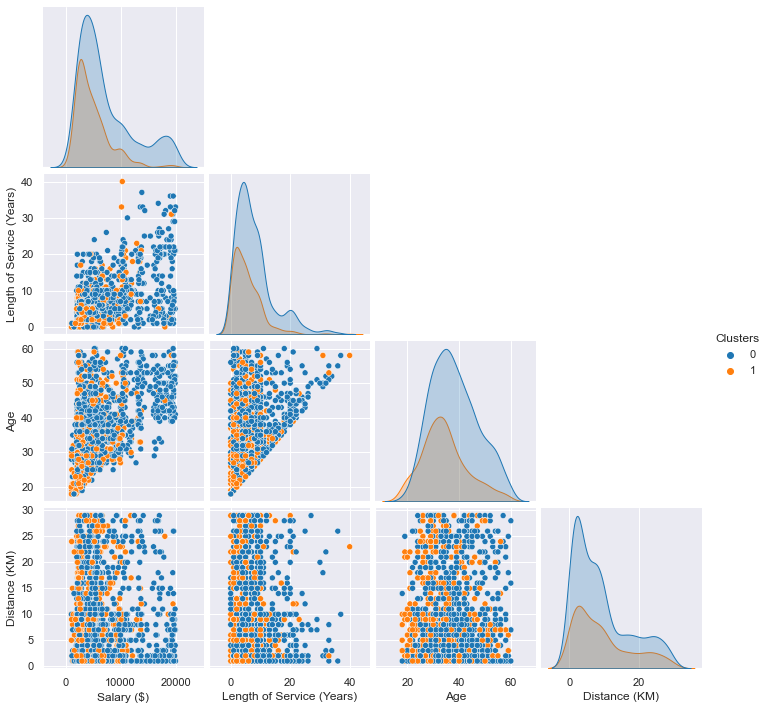

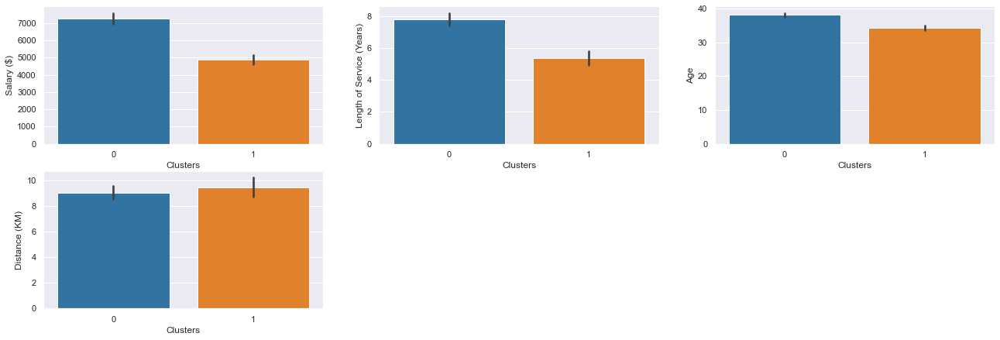

In [46]:
df_to_plot = get_cluster_info(comp_df,lbls)
bar_plot(df_to_plot)
plt.show()

# MeanShift
1. Mean-Shift look for regions of high density.

In [49]:
# def mean_shift(X: Sequence, bandwidth=None) -> Tuple[None,Sequence, Sequence, sklearn.cluster.MeanShift]:
#     """
#     Returns no. of cluster, labels, centroids, and labels for Meanshift
#     """
#     df = X.copy()
#     ms = MeanShift(bandwidth=bandwidth)
    
#     df = gower_matrix(df,cat_features=[col in select_cols for col in df.columns])
#     cluster_lbls = ms.fit_predict(df)
#     return None, cluster_lbls, ms.cluster_centers_ ,ms

In [52]:
# cluster_visualization(comp_df,n_clust=None,model=mean_shift)

# Affinity Propagation

In [48]:
def affinity_prop(X: Sequence) -> Tuple[Sequence]:
    """
    Returns no. of cluster, labels, centroids, and labels for Meanshift
    """
    df = X.copy()
    ap = AffinityPropagation(affinity='precomputed', random_state=75)
    df = gower_matrix(df,cat_features=[col in select_cols for col in df.columns])
    cluster_lbls = ap.fit_predict(df)
    return None, cluster_lbls, ap.cluster_centers_ ,ap

# OPTICS

In [67]:
def optics(X):
    df = X.copy()
    df = gower_matrix(df,cat_features=[col in select_cols for col in df.columns])
    # df =PCA(n_components=4).fit_transform(df)
    dbscan = OPTICS(eps=1, min_samples=26, metric='precomputed', algorithm='auto', n_jobs=-1)
    lbls =dbscan.fit_predict(df)
    return lbls
lbls= optics(comp_df)

#### **Cluster Info**

,Age,Resign Status,MaritalStatus,Education,Job Function,Distance (KM),Length of Service (Years),Salary ($),Cluster Size (% of Total)
Clusters,,,,,,,,,
-1,36.500000,No,Married,3,Research & Development,9.383000,7.120000,6529.934000,2.653061
0,37.179487,No,Single,4,Research & Development,7.307692,7.717949,5591.410256,5.306122
1,37.743590,No,Single,3,Research & Development,7.948718,6.102564,6562.641026,3.333333
2,37.775510,No,Divorced,3,Research & Development,9.326531,7.244898,6266.816327,7.687075
3,37.796460,No,Married,3,Research & Development,9.849558,7.353982,6891.513274,3.061224
4,37.088889,No,Married,2,Research & Development,7.688889,6.177778,5045.422222,5.102041
5,39.920000,No,Married,4,Research & Development,8.506667,5.453333,5969.600000,2.993197
6,36.772727,No,Married,3,Sales,9.454545,7.363636,8225.818182,1.836735
7,36.333333,No,Married,4,Sales,9.444444,7.703704,6552.185185,NaN


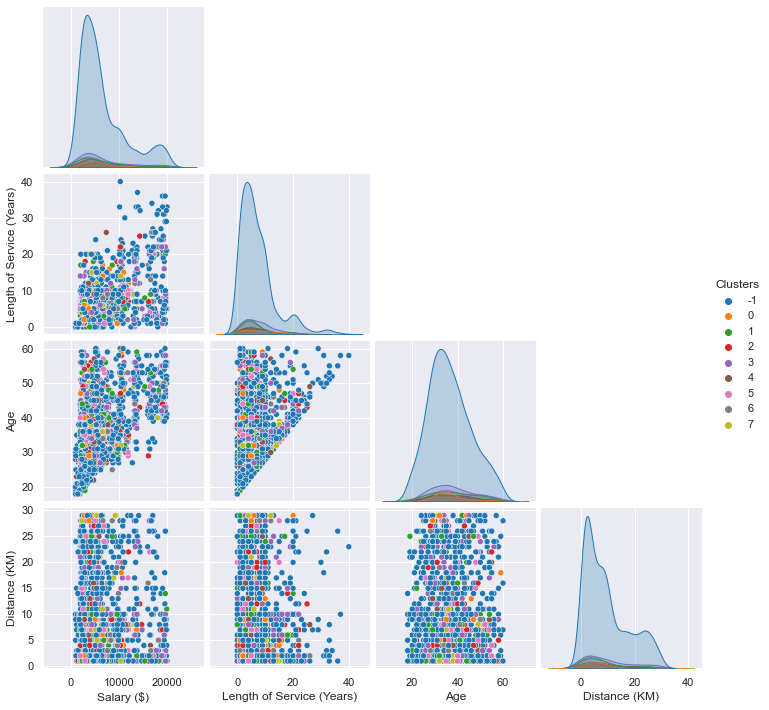

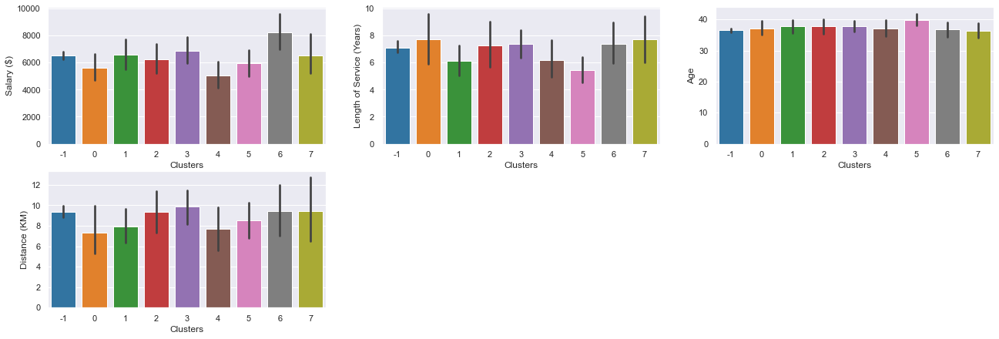

In [68]:
df_to_plot=get_cluster_info(comp_df,lbls)
bar_plot(df_to_plot)
plt.show()

In [49]:
def spectral_cluster(n_clusters: int, X: Sequence) -> Tuple[int, Sequence, Sequence, sklearn.cluster.SpectralClustering]:
    """
    Returns labels for spectral clustering
    """
    spectral = SpectralClustering(n_clusters=n_clusters,random_state=rstate,n_jobs=-1,verbose=2, assign_labels='discretize')
    df = X.copy()
    gower_mat = gower_matrix(df,cat_features=[col in select_cols for col in df.columns])
    cluster_lbls = spectral.fit_predict(gower_mat)
    # Groupby for cluster centroids
    return None, cluster_lbls, df.groupby(cluster_lbls).mean() ,spectral


In [50]:
spectral_lbls = cluster_visualization(comp_df,6,model=spectral_cluster)

Computing label assignment using discretize
calinski_harabasz_score 267.4428205869021
For n_clusters = 6 The average silhouette_score is : 0.28335795


#### **Cluster Info**

,Age,Resign Status,MaritalStatus,Education,Job Function,Distance (KM),Length of Service (Years),Salary ($),Cluster Size (% of Total)
Clusters,,,,,,,,,
0,33.432836,Yes,Single,3,Sales,10.373134,4.805970,5645.059701,4.557823
1,37.090062,No,Single,3,Research & Development,8.635093,7.329193,6707.403727,43.809524
2,33.927928,Yes,Married,3,Research & Development,10.612613,5.378378,4439.351351,7.551020
3,36.000000,Yes,Married,4,Sales,13.545455,5.545455,4655.090909,0.748299
4,32.148936,Yes,Single,3,Research & Development,10.553191,4.340426,4095.808511,3.197279
5,38.100000,No,Married,3,Research & Development,9.210169,7.454237,6991.601695,40.136054


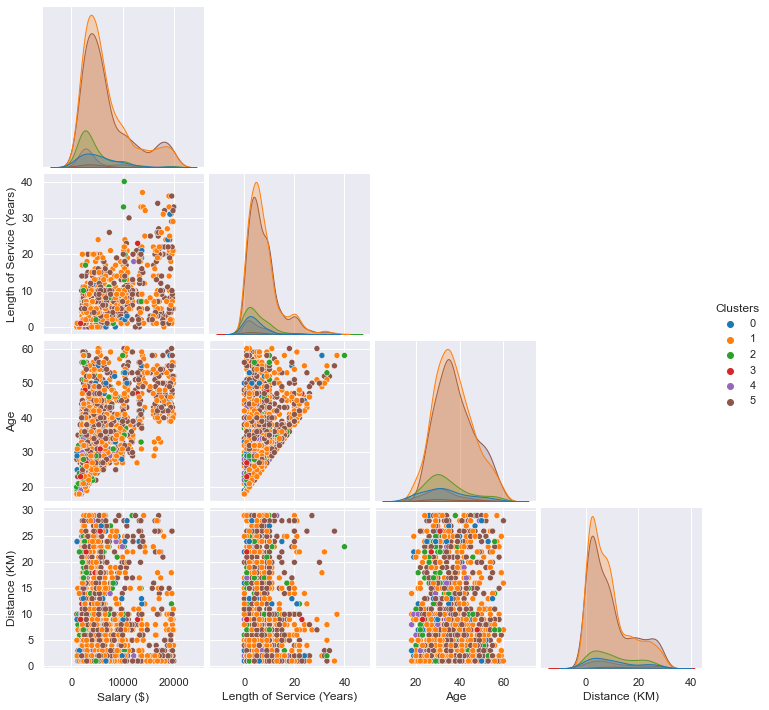

In [51]:
plot_n=get_cluster_info(comp_df,spectral_lbls)

# Model Improvement





- As part of the model improvement process, I will attempt to explore methods for different models so that we can improve the quality of clustering.
- For example, models that require us to specify number of clusters, we can plot an elbow plot. However, some models do not require us to specify number of clusters, hence we are better off using other methods

### Select optimal no. of clusters for K-Prototypes
1. Initially, we found out that the default number of clusters, (`n_clusters = 8`) did not provide quality or meaningful clusters. Some problems include the cluster size being too small, given that the thickness of silhoette plot is inconsistent among the clusters. There are some clusters with thick, while other clusters are quite large. Furthermore, from the scatter plot we noted that there were significant overlapping clusters. However our dataset is quite huge in terms of rows, hence this may be a issue for most models.
2. We also noted that some silhouette coefficients were negative, hence instances may be wrongly assigned, hence clusters may not be well defined.
3. Given these issues, our clusters may not be very distinct, as such interpretability and explicability may be an issue.


### K-Prototypes Elbow plot
1. We will first plot an elbow plot to find the optimal number of clusters. 
2. We need to record the clustering cost of K-prototypes clusters, as the number of clusters increase. As mentioned, the lower the cost, the more tightly packed the cluster is. However, the clustering cost obviously would decrease with an increase of clusters. Hence, we want to find the point where the elbow plot flattens (shows elbow shape). This is where the decrease in clustering cost slows down(stops dropping fast), which would mean that the optimal number cluster would be around that area, and increasing more would not provide significant improvements
3. To plot the elbow plot, we will first perform normalization on numerical features, then instead of calculating the within sum of squared errors (WSSE), k prototypes provides cost function that combines calculation for numerical & categorical variables. We record the clustering cost via the `.cost_` attribute. 

In [52]:
# The elbow rule is a simple technique to select the number of clusters when using K-Prototypes: just plot the Clustering Cost (the sum of distance from each instance to its centroid) as a function of the number of clusters, and find the point in the curve where the inertia stops dropping fast (the "elbow"). This is generally close to the optimal number of clusters. 
# 2. To visualize and pick number of clusters better, we will use the approach of plotting the silhouette score as a function of the number of clusters. There will often be a peak, and the optimal number of clusters is generally nearby.

In [53]:
elbow_df = comp_df.copy()
costs = []
n_clusters = []
for i in tqdm(range(2, 10)):
    try:
        elbow_df = custom_scaling(elbow_df,int_cols=int_cols)
        kproto = KPrototypes(n_clusters=i, init='Cao',random_state=rstate, max_iter=500)
        kproto.fit_predict(elbow_df, categorical=cat_cols)
        costs.append(kproto.cost_)
        n_clusters.append(i)
    except:
        print(f"Can't cluster with {i} clusters")
fig = go.Figure(data=go.Scatter(x=n_clusters, y=costs, ))
fig.update_layout(    scene = dict(xaxis_title='No. of clusters',
                    yaxis_title='Cost' ),
    title="Elbow Plot",
    font=dict(
        size=12,
        color="RebeccaPurple"
    ))
fig.update_xaxes(title_text = "No. Clusters").update_yaxes(title_text = "Clustering Cost")
fig.show()
# notice where it flattens

 38%|███▊      | 3/8 [00:29<00:48,  9.77s/it]

Can't cluster with 4 clusters


100%|██████████| 8/8 [01:35<00:00, 11.99s/it]


**Observations**
1. From the elbow plot, we can see that the optimal clusters appear to be around 5 or 6. However, there is no specific number clearly shown as the elbow shape is not very clear.


In [ ]:
for counter in range(4,7):
    _ = cluster_visualization(comp_df,counter,k_prototypes,metric = 'precomputed')

calinski_harabasz_score 218.27981923341898
For n_clusters = 4 The average silhouette_score is : 0.23215172
Clustering cost: sum distance of all points to respective cluster centroids 458.43596888237965


calinski_harabasz_score 170.06214545798537
For n_clusters = 5 The average silhouette_score is : 0.21322876
Clustering cost: sum distance of all points to respective cluster centroids 436.70115429023724


calinski_harabasz_score 138.3908656780597
For n_clusters = 6 The average silhouette_score is : 0.19817476
Clustering cost: sum distance of all points to respective cluster centroids 418.36748233337624


- To further reduce the ambiguity of clustering, I will perform unsupervised feature selection for k prototypes to select the more relevant features.

# Unsupervised Feature Selection for K-Prototypes

1. We hope to select features that produce quality and distinct clusters so that our cluster interpretation would be accurate and meaningful. With unsupervised feature selection, clustering would be performed on different subset of features. Our goal is to minimize the cost of clustering, which is defined as the sum distance of all points to their respective cluster centroids.
2. Since, we start off at 9 features, I will be trying out the different combination subsets of 7 and 8 features using `combinations` from itertools library.
> **Why 7 & 8 features for clustering?**
1. We may face the problem of information loss of the clusters if we try to reduce subset of features further. As a result, our clusters may have a lack of information. In such a scenario, it would be difficult to devise retention strategies to target the most vulnerable group of employees.

In [47]:
def select_best_feature(n_clusters,X:Sequence, init='Cao'):
    """
    Function to perform k prototypes clustering, and returning the cost
    """
    df = X.copy()
    # Define categorical var
    cat_name=df.select_dtypes(exclude = 'int').columns

    cat_cols = [df.columns.get_loc(c) for c in cat_name]

    # Perform minmax scaling
    df = custom_scaling(df, int_cols=df.select_dtypes(include = 'int').columns)
    
    k_pro = KPrototypes(n_clusters=n_clusters,max_iter=1000, random_state=rstate, init=init, n_jobs=-1)
    k_pro.fit(df, categorical=cat_cols)
    lbls = k_pro.predict(df, categorical=cat_cols)
    return lbls,k_pro.cost_, k_pro

- I will be appending the cost, number of clusters and the feature set to a list

In [48]:
features_sets = chain(combinations(comp_df.columns,7), combinations(comp_df.columns,8))
# features_sets = combinations(comp_df.columns,8 )
logs = []
for features in tqdm(features_sets):
    for n_cluster in range(2,10):
        labels, cost, model= select_best_feature(n_cluster, comp_df[list(features)])
        logs.append([features, n_cluster, cost])

45it [38:27, 51.29s/it]


### Elbow plot for the different combinations of features.
1. I will be using plotly so we can easily hover over the lines to see the feature subset that provides quality clustering

In [49]:
records_df = pd.DataFrame(logs, columns=['Features', 'n_cluster', 'Cost']).set_index("Features") 
cost_df = records_df.pivot_table(values = 'Cost', index='n_cluster', columns='Features')
fig = px.line(x=records_df['n_cluster'], y=records_df['Cost'] , color=records_df.index,
              line_group=records_df.index,
              labels=dict(x="No. Clusters", y="Clustering Cost"),width=1400, height=400)
fig.update_layout(
    title="Elbow Plot of the different combinations of features",
    font=dict(
        size=12,
        color="RebeccaPurple"
    ))
fig.show()

## Hierarchical Clustering
1. We need to opt for model improvement for agglomerative clustering. This is because using the default parameters does not give us any distinguishiable clusters. Moreover, from the descriptive statistics, there is no significant difference between the clusters, at most it only distinguishes between employees with slightly higher salary and employees with lower salary. Hence, it would be hard for us to brainstorm any retention strategies for employees as there is not enough details. Hence we need to search for better clusters. 
> **Dendrogram**
1. To search for more quality clusters, we will plot a dendrogram, which plots the distances/dissimilarity between clusters in the vertical axis. The dendrogram is a result of the linking of points in a dataset. We are able to bette visualize the hierarchical clustering or merging process.
2. With a dendrogram, we can select the number of clusters by drawing a line to cut the dendrogram when the clusters formed start becoming too similar.



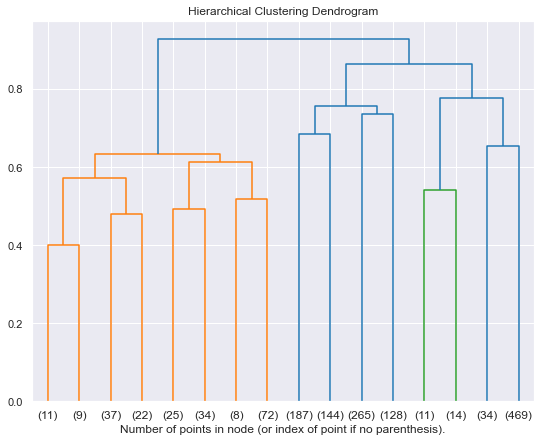

In [50]:
def plot_dendrogram(model, **kwargs):
    # Create linkage matrix and then plot the dendrogram

    # create the counts of samples under each node
    counts = np.zeros(model.children_.shape[0])
    n_samples = len(model.labels_)
    for i, merge in enumerate(model.children_):
        current_count = 0
        for child_idx in merge:
            if child_idx < n_samples:
                current_count += 1  # leaf node
            else:
                current_count += counts[child_idx - n_samples]
        counts[i] = current_count

    linkage_matrix = np.column_stack([model.children_, model.distances_,
                                      counts]).astype(float)

    # Plot the corresponding dendrogram
    dendrogram(linkage_matrix, **kwargs)

    
gower_mat = gower_matrix(comp_df,cat_features=[col in select_cols for col in comp_df.columns])
agg_cluster = AgglomerativeClustering(distance_threshold=0, n_clusters=None,affinity= 'precomputed', linkage= 'complete').fit(gower_mat)

plt.figure(figsize = (9,7))
plt.title('Hierarchical Clustering Dendrogram')
plot_dendrogram(agg_cluster, truncate_mode='level', p=3)
# plt.hlines(5.5, 0, 300, colors = 'r') 
# Plotting the clutering line with optimal seperation
plt.xlabel("Number of points in node (or index of point if no parenthesis).")
plt.show()



# Alternatively, it can do the opposite - it can look at all the data points, find 2 points that are closer to each other, link them, and then find other points that are the closest ones to those linked points and keep building the 2 groups from the bottom-up. Which is the agglomerative approach we will develop.


# Finding an interesting number of clusters in a dendrogram is the same as finding the largest horizontal space that doesn't have any vertical lines (the space with the longest vertical lines). This means that there's more separation between the clusters.

# We can draw a horizontal line that passes through that longest distance:


# The initial groups (objects) are on the leaves (at the bottom of the figure), and we join them in the tree each time when two groups are merged. 
# We can use a dendrogram to visualize the history of groupings and figure out the optimal number of clusters.

#     Determine the largest vertical distance that doesn’t intersect any of the other clusters
#     Draw a horizontal line at both extremities
#     The optimal number of clusters is equal to the number of vertical lines going through the horizontal line

# Cluster Interpretations

In [ ]:
def plot_decision_tree(df,depth=4,leaf=12):
    dec = DecisionTreeClassifier(max_depth=depth, min_samples_leaf=leaf,random_state=rstate)

    dec.fit(df.drop(columns='Cluster'), df['Cluster'])

    fig, ax = plt.subplots(figsize = (30,13))
    plot_tree(
                dec,
                feature_names = df.drop(columns='Cluster').columns,
                class_names= np.unique(df['Cluster'].values.astype(str)),
                filled = True, 
                impurity=False,
                ax = ax, 
                fontsize=15
                )
    fig.show()

In [ ]:
sil_score = {}
for q in np.arange(0.01, 0.25, 0.01):
    bandwidth = estimate_bandwidth(
        final_eval, quantile=q, n_samples=len(final_eval))

    ms = MeanShift(bandwidth=bandwidth, bin_seeding=True).fit(final_eval)
    sil_score[q] = silhouette_score(
        final_eval, ms.labels_, metric='euclidean')

qt_sil = pd.Series(sil_score, name='Bandwidth').plot(ylabel='Silhouette Score', 
        xlabel='Quantile', 
        title='Mean Shift Clustering - Quantile vs Silhouette')
# plt.axvline(0.13, linestyle='--', color='black')

plt.show()

NameError: name 'final_eval' is not defined

In [ ]:
# bandwidth = estimate_bandwidth(final_eval, quantile=0.)
# df  = eval_df(mean_shift, dict(bandwidth = bandwidth, X=final_eval))

# Conclusion:

References:
1. https://www.americanprogress.org/wp-content/uploads/2012/11/CostofTurnover.pdf
2. https://www.researchgate.net/publication/352390912_Employee_Turnover_Causes_Importance_and_Retention_Strategies
3. https://gethppy.com/employee-turnover/numbers-fall-4-negative-effects-employee-turnover

4. https://stats.mom.gov.sg/Pages/Labour-Turnover-Summary-Table.aspx
5. https://www.jstor.org/stable/25146163
1. https://www.performancemagazine.org/consequences-employee-turnover/
7. https://www.talentlyft.com/en/resources/what-is-turnover-costs#:~:text=Turnover%20costs%20definition-,Turnover%20cost%20refers%20to%20expenses%20both%20tangible%20or%20intangible%20associated,%E2%80%A2%20COBRA%20benefits%20continuation%20costs
8. Z. Huang. Extensions to the k-Means Algorithm for Clustering
Large Data Sets with Categorical Values (1998). Data Mining and Knowledge Discovery. 2(3): 283–304.

